In [1]:
import os
import csv
import cv2
import math
import time
import json
import glob
import shutil
import seaborn as sn
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm as tqdm
from tabulate import tabulate

In [2]:
Match_result_csv_path = '../csv_file/PBL_match_result_all_cej_bone_fold1.csv'
Match_result_csv = pd.read_csv(Match_result_csv_path)

show_csv = Match_result_csv[['image_name','tooth_side','stage','PBL_predict_tooth','PBL_value','PBL_stage','tooth_path']]

In [3]:
Match_result_csv.head()

,Unnamed: 0,image_name,tooth_side,stage,PBL_predict_tooth,PBL_value,PBL_stage,tooth_path,CEJ_points,Bone_level_points
0,0,NN_190619_104716_EA3E9,9M,1.0,9_L,12.255,1,NN_190619_104716_EA3E9_0.PNG,1,1
1,1,NN_190619_104716_EA3E9,9D,1.0,9_R,9.233,1,NN_190619_104716_EA3E9_0.PNG,1,1
2,2,NN_190619_104716_EA3E9,10M,3.0,10_L,27.999,2,NN_190619_104716_EA3E9_1.PNG,1,1
3,3,NN_190619_104716_EA3E9,10D,3.0,10_R,70.792,3,NN_190619_104716_EA3E9_1.PNG,1,1
4,4,NN_190619_104720_EA3E7,7D,1.0,7_L,32.519,2,NN_190619_104720_EA3E7_1.PNG,1,1


In [4]:
stage_set = list(set(Match_result_csv['stage']))
print(stage_set)
PBL_stage_set = list(set(Match_result_csv['PBL_stage']))
print(PBL_stage_set)

[0.0, 1.0, 2.0, 3.0]
[nan, '3', '0', '2', '-999', 'No_match', '1']


In [5]:
folder_path = '../'
o_image_folder = os.path.join(folder_path,'1_o_image')
o_image_path_list = glob.glob(o_image_folder+'/*.PNG')
o_image_path_list.sort()

s_image_folder = os.path.join(folder_path,'1_seg_image')
s_image_path_list = glob.glob(s_image_folder+'/*.PNG')
s_image_path_list.sort()

seg_image_folder = os.path.join(folder_path,'3_pattern_detection_result')
seg_image_point_path_list = glob.glob(seg_image_folder+'/*.PNG')
seg_image_point_path_list.sort()

seg_fill_image_folder = os.path.join(folder_path,'2_seg_img_with_cej')
seg_fill_image_point_path_list = glob.glob(seg_fill_image_folder+'/*.PNG')
seg_fill_image_point_path_list.sort()

#seg_image_folder = os.path.join(folder_path,'4_result_with_label')
seg_image_folder = os.path.join(folder_path,'3_pattern_detection_result')
seg_image_info_path_list = glob.glob(seg_image_folder+'/*.PNG')
seg_image_info_path_list.sort()

json_save_path = '../../../json_file/*.json'
json_file_list = glob.glob(json_save_path)
print(len(json_file_list))

print(len(o_image_path_list),len(seg_image_info_path_list),len(seg_image_point_path_list))

2973
2511 7420 7420


In [6]:
## PBL_stage,CEJ_points,Bone_level_points should be string
target_case = {'image_name':None,'stage':3,'PBL_stage':None,'CEJ_points':None,'Bone_level_points':None}

In [7]:
if target_case['stage'] == 3:
    PBL_value_range = [(0, 27)]
elif target_case['stage'] == 2:
    PBL_value_range = [(0, 9), (39,1000)]
elif target_case['stage'] == 1:
    PBL_value_range = [(21, 1000)]
elif target_case['stage'] == 0:
    PBL_value_range = [(21, 1000)]

In [8]:
Match_result_csv.head()

,Unnamed: 0,image_name,tooth_side,stage,PBL_predict_tooth,PBL_value,PBL_stage,tooth_path,CEJ_points,Bone_level_points
0,0,NN_190619_104716_EA3E9,9M,1.0,9_L,12.255,1,NN_190619_104716_EA3E9_0.PNG,1,1
1,1,NN_190619_104716_EA3E9,9D,1.0,9_R,9.233,1,NN_190619_104716_EA3E9_0.PNG,1,1
2,2,NN_190619_104716_EA3E9,10M,3.0,10_L,27.999,2,NN_190619_104716_EA3E9_1.PNG,1,1
3,3,NN_190619_104716_EA3E9,10D,3.0,10_R,70.792,3,NN_190619_104716_EA3E9_1.PNG,1,1
4,4,NN_190619_104720_EA3E7,7D,1.0,7_L,32.519,2,NN_190619_104720_EA3E7_1.PNG,1,1


In [9]:
# print(PBL_value_range[1][0],PBL_value_range[1][1])

In [10]:
target_table = Match_result_csv

for key in target_case:
    if target_case[key] != None:
        target_table = target_table.loc[(target_table[key] == target_case[key])]

if target_case['stage']==2:
    type_ = 0# 0:(0%~9%) 1:(>39%)
    target_table['PBL_value'] = pd.to_numeric(target_table['PBL_value'], errors='coerce')
    target_table = target_table.dropna()
#     show_table1 = target_table.loc[(target_table['PBL_value'] > PBL_value_range[0][0]) & (target_table['PBL_value'] < PBL_value_range[0][1])]
#     show_table2 = target_table.loc[(target_table['PBL_value'] > PBL_value_range[1][0]) & (target_table['PBL_value'] < PBL_value_range[1][1])]
#     show_table = pd.concat([show_table1, show_table2])
    show_table = target_table.loc[(target_table['PBL_value'] > PBL_value_range[type_][0]) & (target_table['PBL_value'] < PBL_value_range[type_][1])]
else:
    target_table['PBL_value'] = pd.to_numeric(target_table['PBL_value'], errors='coerce')
    target_table = target_table.dropna()
    show_table = target_table.loc[(target_table['PBL_value'] > PBL_value_range[0][0]) & (target_table['PBL_value'] < PBL_value_range[0][1])]


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [11]:

target_table = show_table
target_table_img_name = target_table['image_name']
target_name_list = list(set(list(target_table_img_name)))
target_name_list.sort()
print(len(target_name_list))

# 0:11張14邊 tooth,  1:166張220邊 tooth,  2: low74張86邊tooth  , high 39張53邊 tooth ,  3:64張82邊 tooth

56


In [12]:
# json
# NN_090218_155953_B4E338
# NN_190619_104757_EA3E5
# NN_180829_111336_16DC2D

56


0 : NN_071019_103621_C073B3
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9941 | 14D          |       3 | 14_R                |       0     |           0 | NN_071019_103621_C073B3_2.PNG |
| 9943 | 15D          |       3 | 15_R                |       8.155 |           1 | NN_071019_103621_C073B3_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['13_LR', '14_LR', '15_LR']


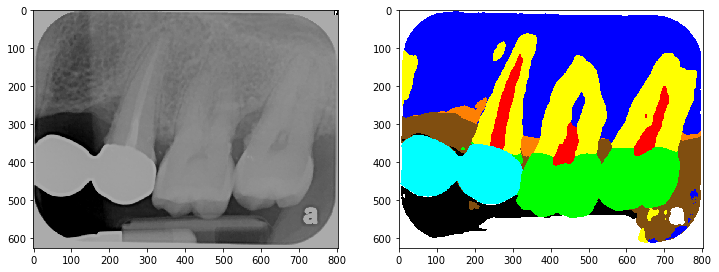

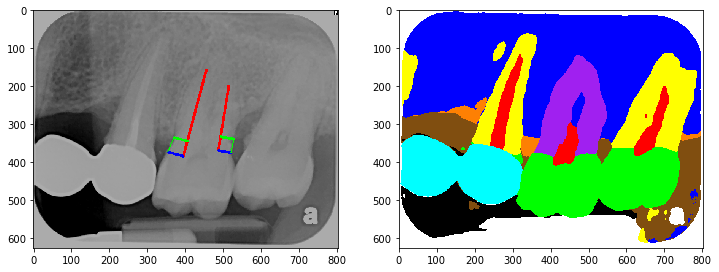

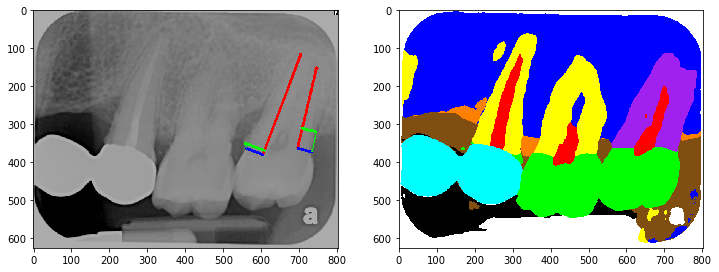

1 : NN_090218_155953_B4E338
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8589 | 24D          |       3 | 24_R                |       0.182 |           1 | NN_090218_155953_B4E338_1.PNG |
| 8590 | 23M          |       3 | 23_L                |       1.162 |           1 | NN_090218_155953_B4E338_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['24_LR', '23_LR', '22_L']


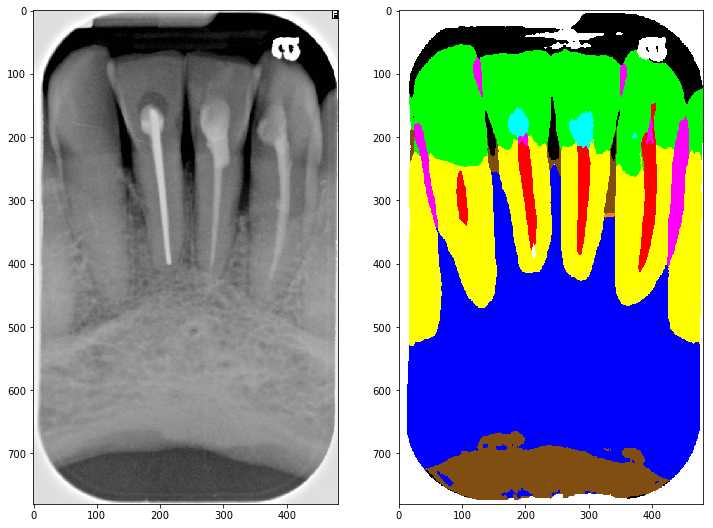

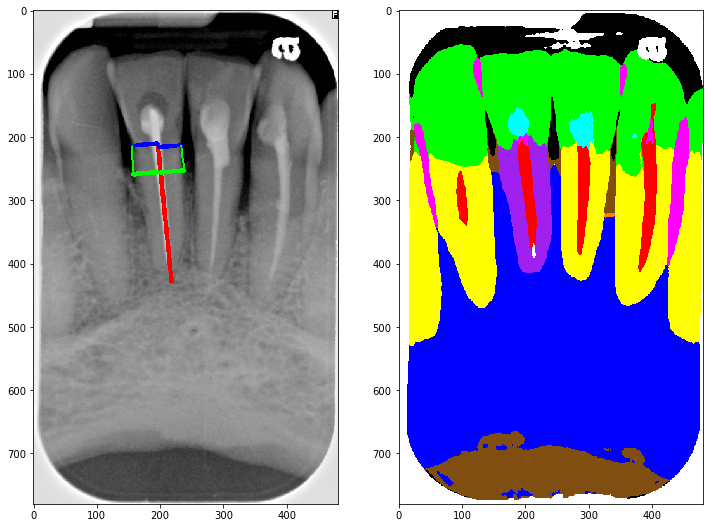

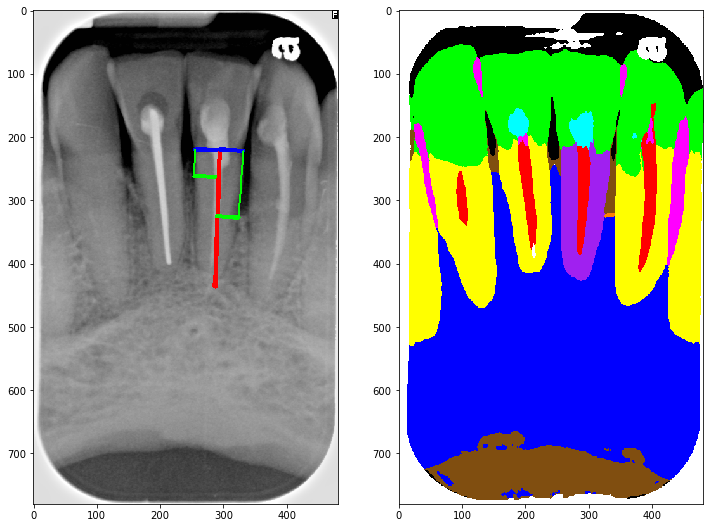

2 : NN_090223_145911_C03738
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9192 | 15M          |       3 | 15_L                |       0     |           0 | NN_090223_145911_C03738_3.PNG |
| 9193 | 15D          |       3 | 15_R                |      21.234 |           2 | NN_090223_145911_C03738_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['13_LR', '15_LR']


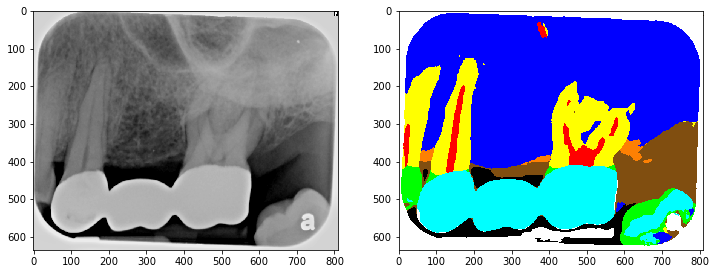

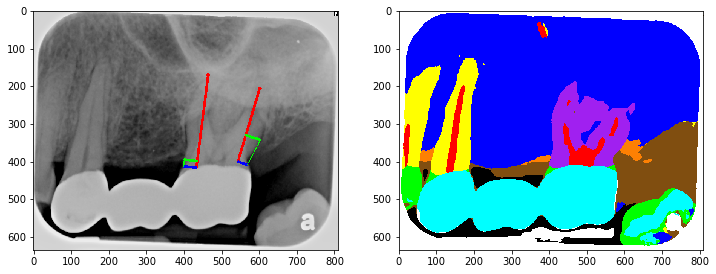

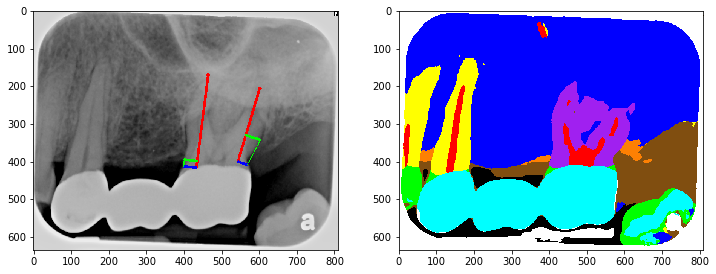

3 : NN_090223_150007_C0373D
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9214 | 15M          |       3 | 15_L                |       0.186 |           1 | NN_090223_150007_C0373D_4.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR', '13_LR', '11_LR', '15_LR']


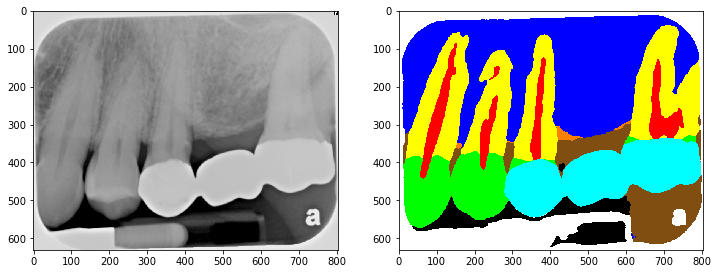

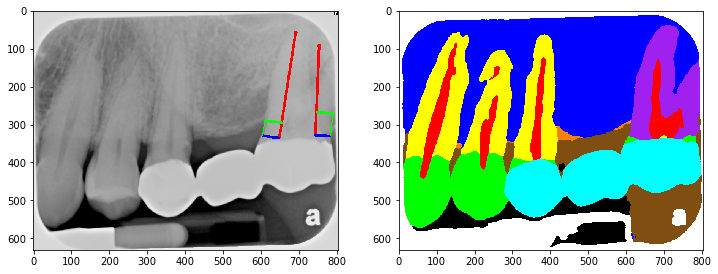

4 : NN_090914_100204_A53396
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7761 | 15D          |       3 | 15_R                |      26.874 |           2 | NN_090914_100204_A53396_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['14_LR', '15_LR', '13_LR']


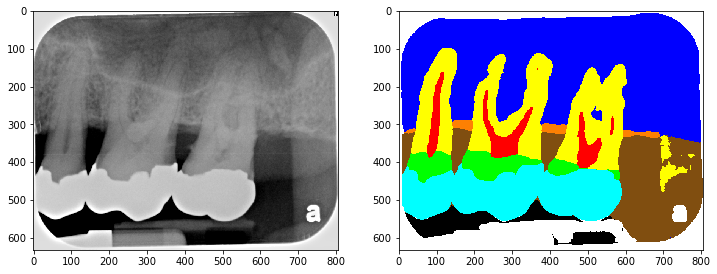

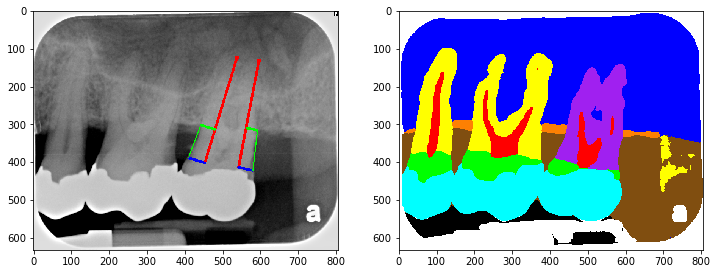

5 : NN_090914_100210_A5339D
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7765 | 18D          |       3 | 18_R                |      26.339 |           2 | NN_090914_100210_A5339D_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['18_LR']


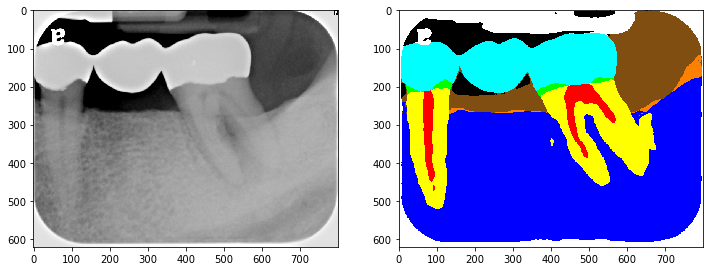

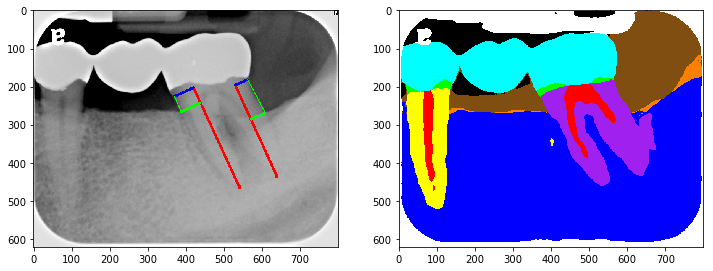

6 : NN_090914_100230_A53399
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7782 | 15D          |       3 | 15_R                |      23.884 |           2 | NN_090914_100230_A53399_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR', '13_LR', '14_LR', '15_LR']


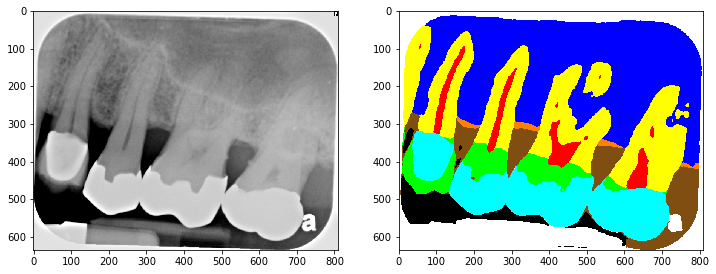

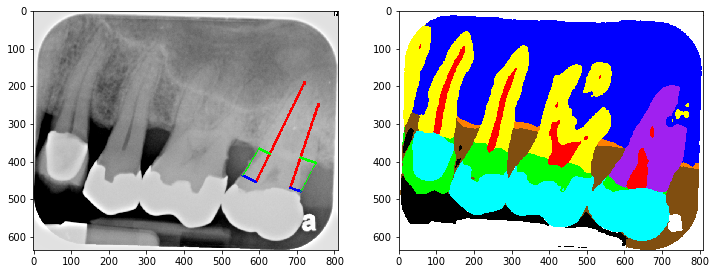

7 : NN_090914_100308_A53398
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7805 | 26D          |       3 | 26_L                |    -999     |        -999 | NN_090914_100308_A53398_0.PNG |
| 7806 | 26M          |       3 | 26_R                |      24.396 |           2 | NN_090914_100308_A53398_0.PNG |
| 7807 | 25D          |       3 | 25_L                |      31.734 |           2 | NN_090914_100308_A53398_1.PNG |
| 7808 | 25M          |       3 | 25_R                |      20.927 |           2 | NN_090914_100308_A53398_1.PNG |
| 7809 | 24M          |       3 | 24_L                |       8.482 |           1 | NN_090914_100308_A53398_2.PNG |
| 7810 | 24D          |       3 | 24_R      

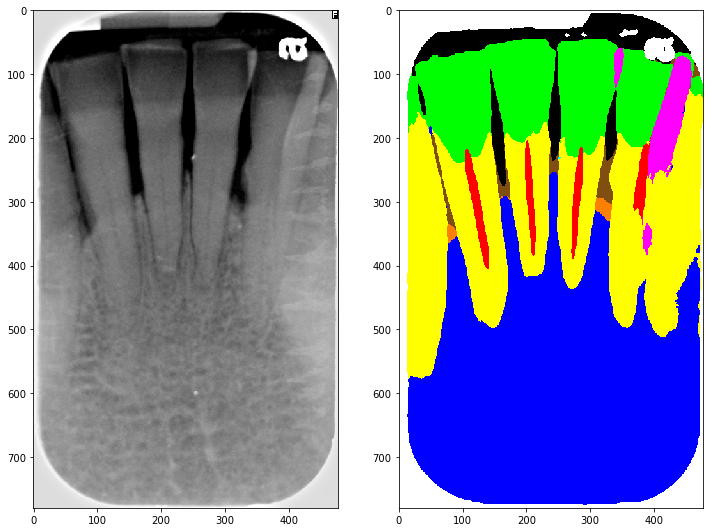

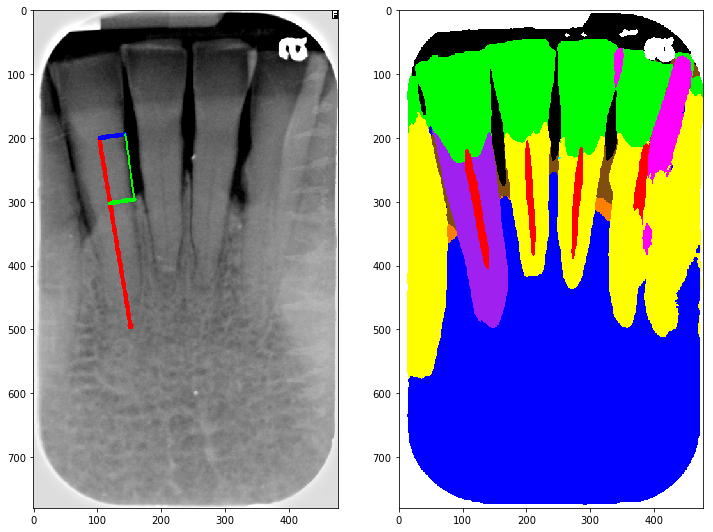

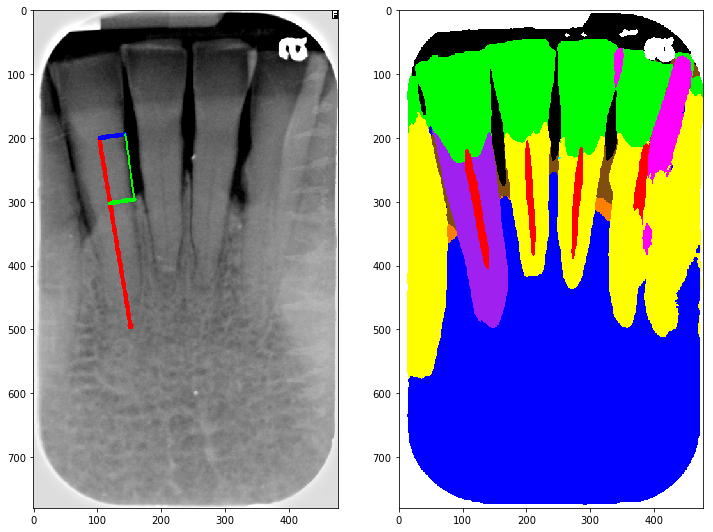

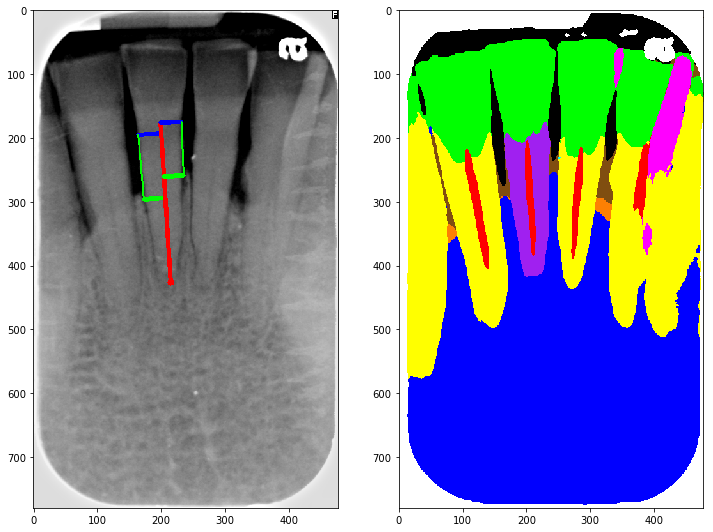

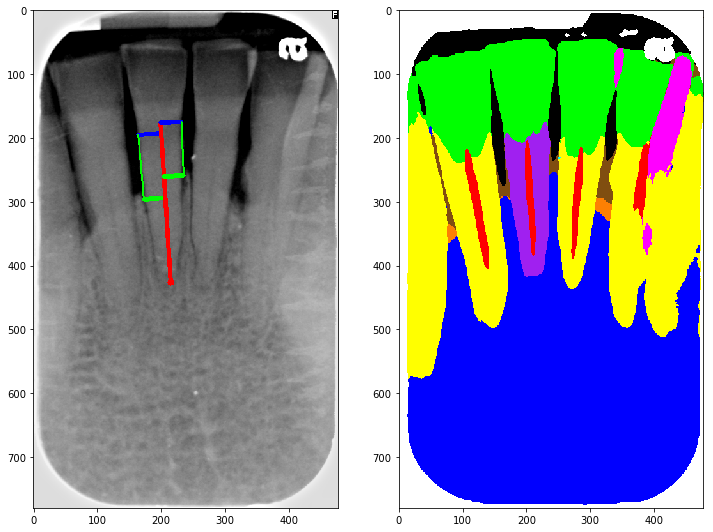

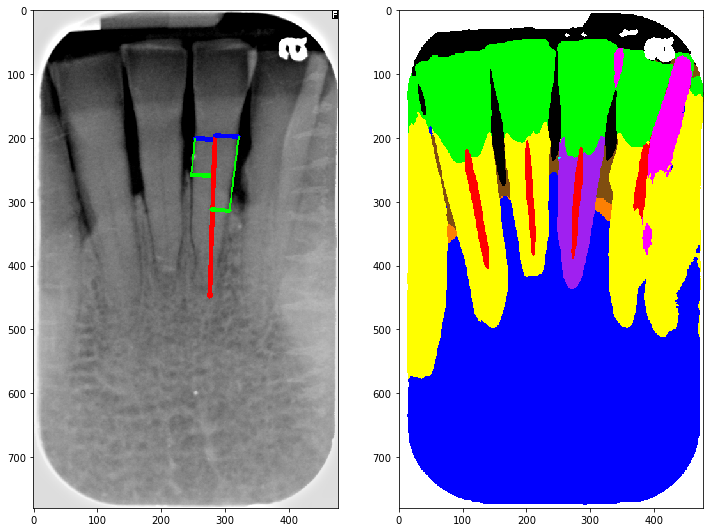

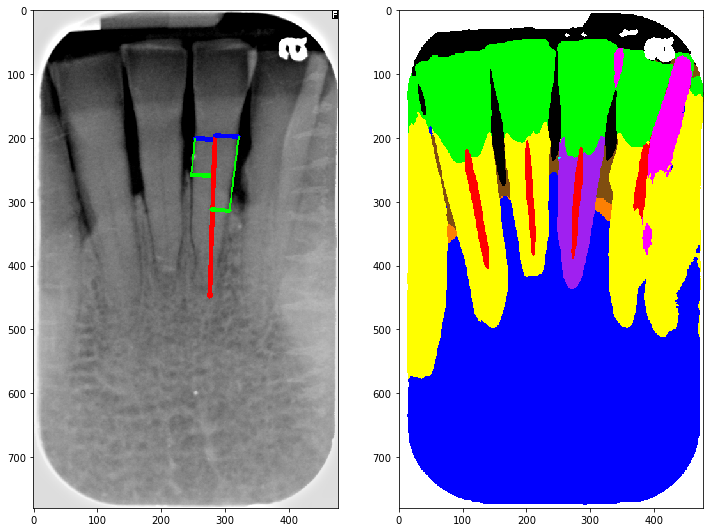

8 : NN_090914_101721_A53397
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7826 | 26D          |       3 | 26_L                |      43.029 |           3 | NN_090914_101721_A53397_2.PNG |
| 7827 | 26M          |       3 | 26_R                |      21.211 |           2 | NN_090914_101721_A53397_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['26_LR']


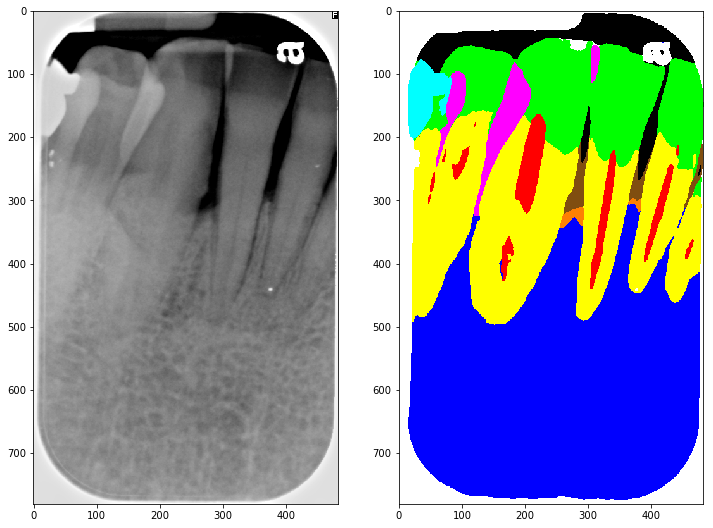

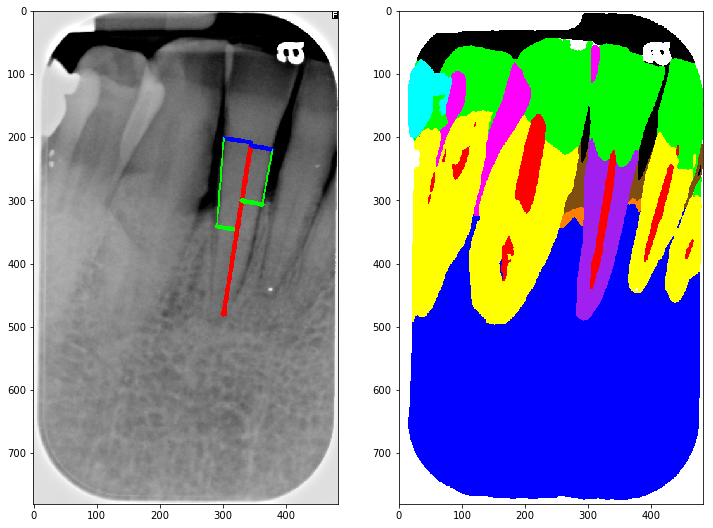

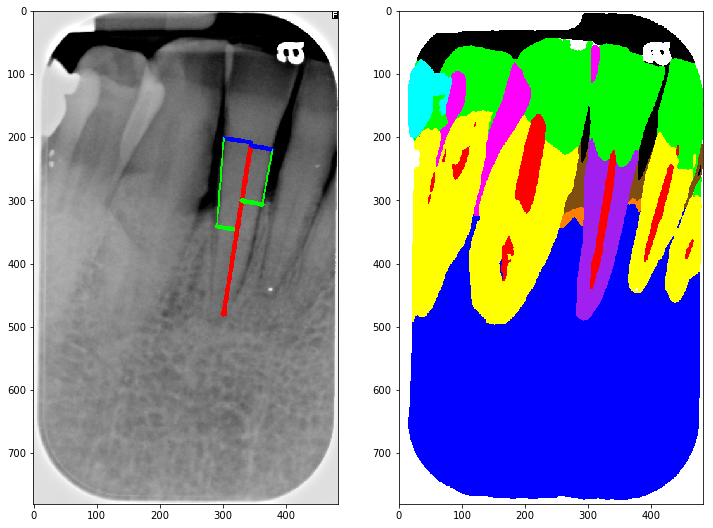

9 : NN_091202_152734_C02648
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8037 | 14D          |       3 | 14_R                |      10.684 |           1 | NN_091202_152734_C02648_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR', '13_LR', '14_LR']


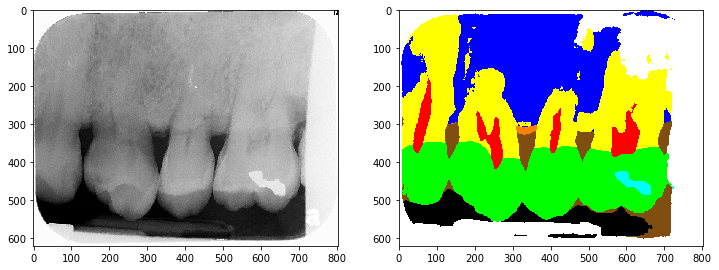

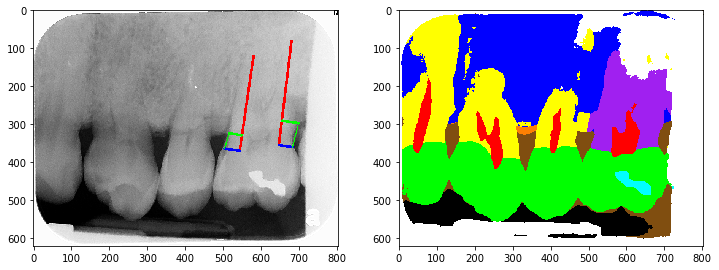

10 : NN_100825_103922_C0381E
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|     | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|-----+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 649 | 25M          |       3 | 25_R                |      21.979 |           2 | NN_100825_103922_C0381E_0.PNG |
| 650 | 24M          |       3 | 24_L                |      28.086 |           2 | NN_100825_103922_C0381E_1.PNG |
| 651 | 24D          |       3 | 24_R                |      74.959 |           3 | NN_100825_103922_C0381E_1.PNG |
| 652 | 23M          |       3 | 23_L                |      63.412 |           3 | NN_100825_103922_C0381E_2.PNG |
| 653 | 23D          |       3 | 23_R                |      82.56  |           3 | NN_100825_103922_C0381E_2.PNG |
+-----+--------------+---------+-------------------

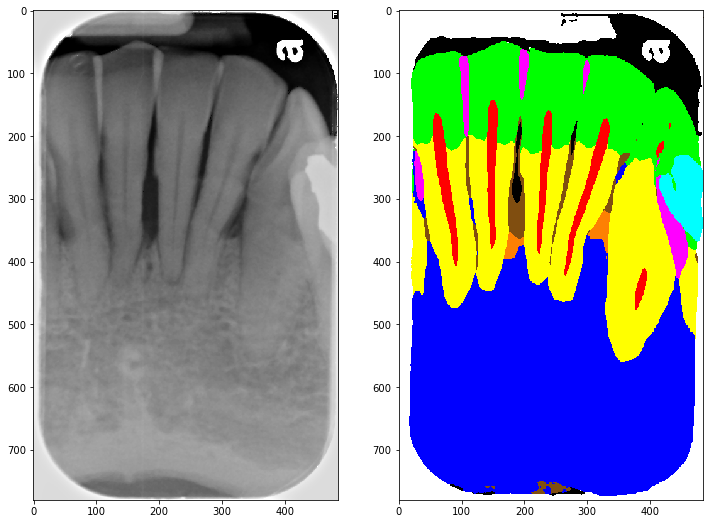

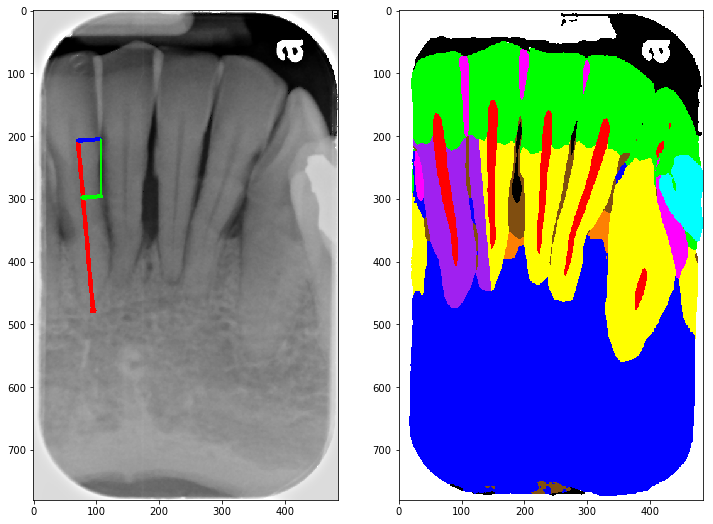

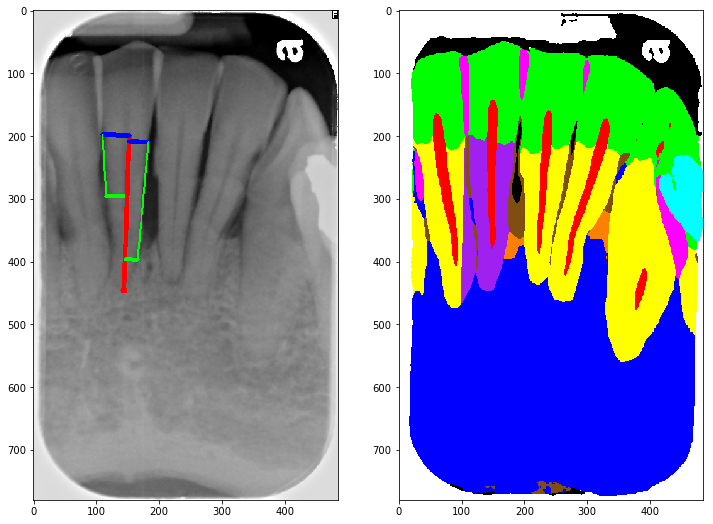

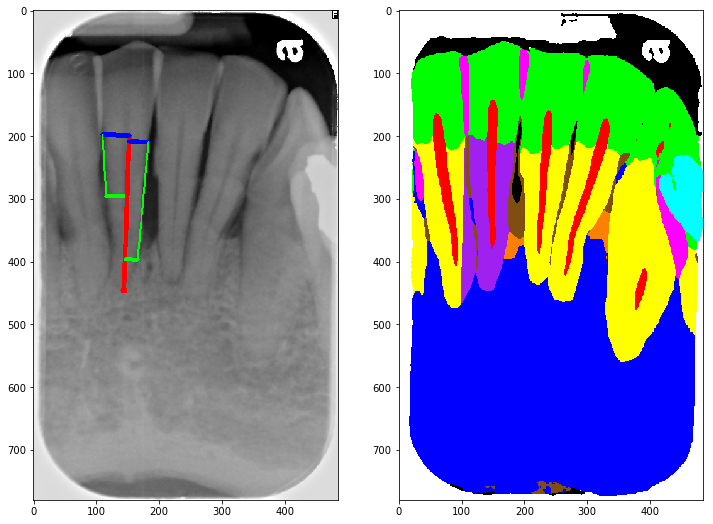

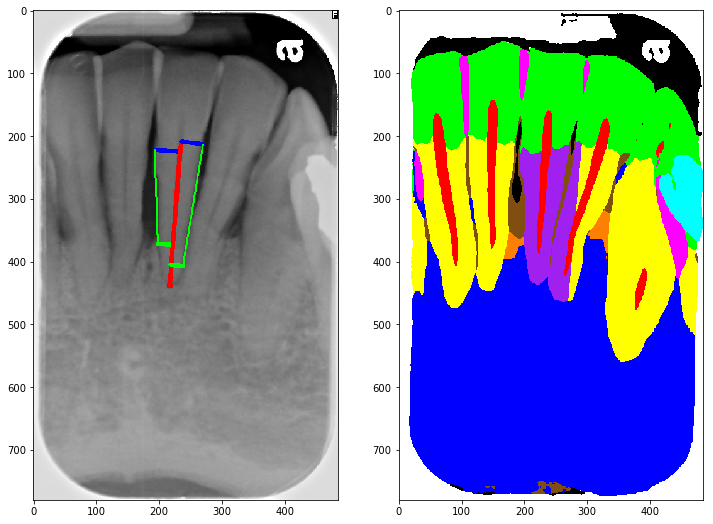

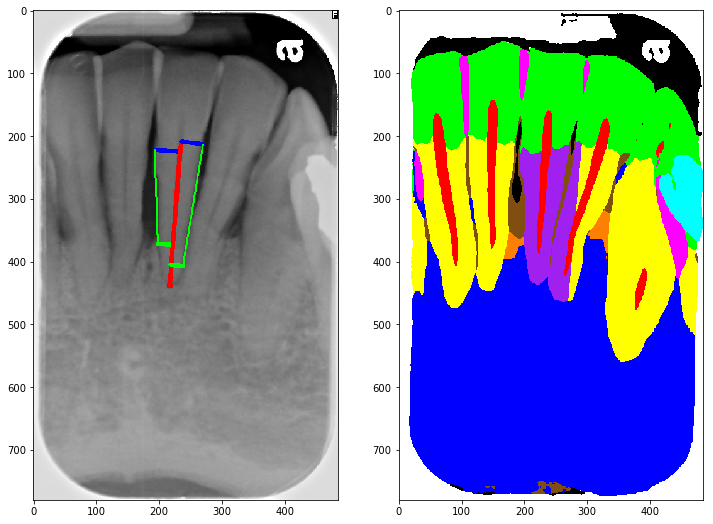

11 : NN_111024_140411_C03564
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8900 | 3D           |       3 | 3_L                 |      25.051 |           2 | NN_111024_140411_C03564_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['3_LR', '2_RH', '4_LR', '5_LR', '6_LR']


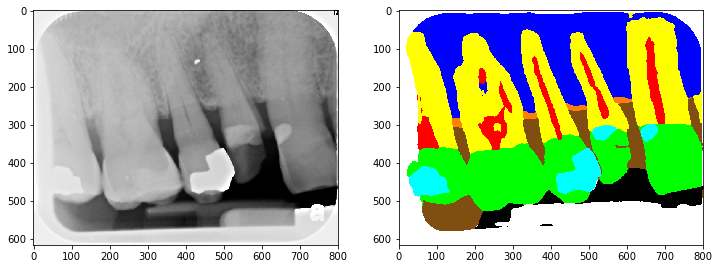

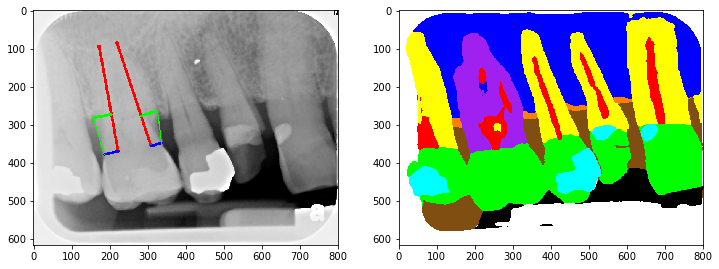

12 : NN_111109_114906_EB80E
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 3282 | 31D          |       3 | 31_L                |      32.672 |           2 | NN_111109_114906_EB80E_0.PNG |
| 3283 | 31M          |       3 | 31_R                |      21.334 |           2 | NN_111109_114906_EB80E_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['31_LR', '30_LR']


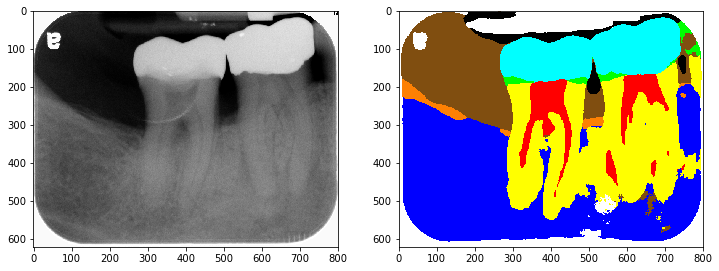

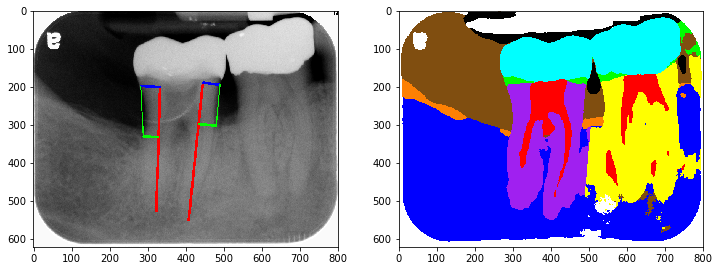

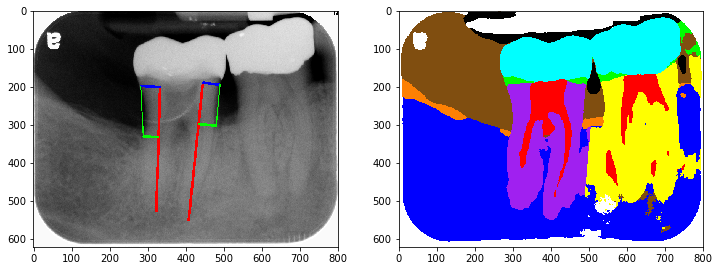

13 : NN_120823_103733_4AA8E
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2141 | 2D           |       3 | 2_L                 |      20.939 |           2 | NN_120823_103733_4AA8E_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['2_LR']


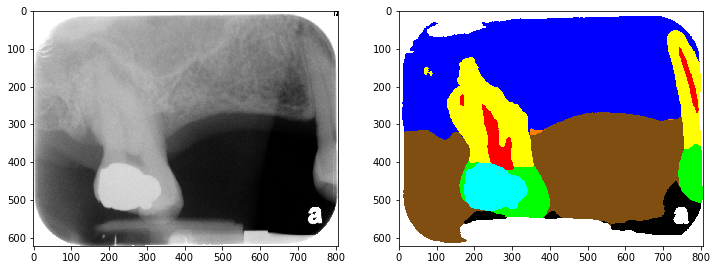

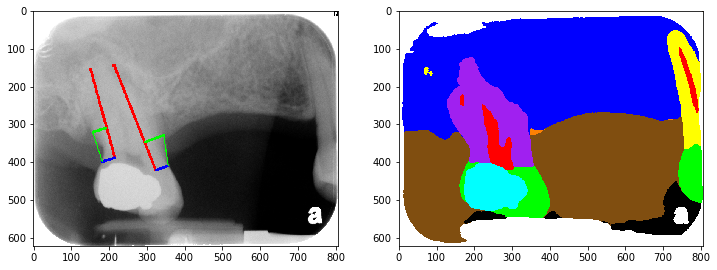

14 : NN_120827_095333_BFFF2F
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 7322 | 2M           |       3 | 2_R                 |      31.489 |           2 | NN_120827_095333_BFFF2F_0.PNG |
| 7324 | 3M           |       3 | 3_R                 |      21.515 |           2 | NN_120827_095333_BFFF2F_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_R']


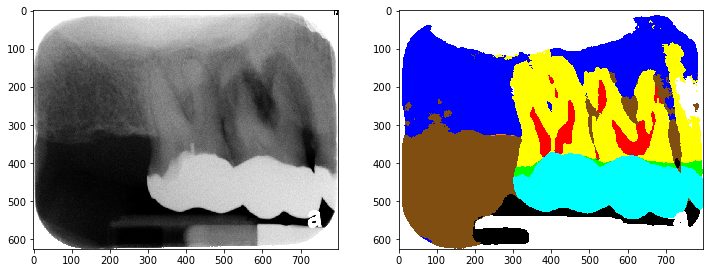

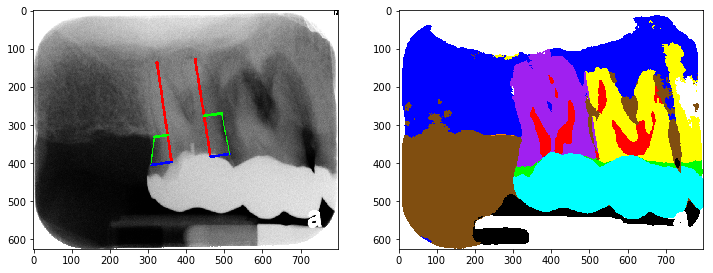

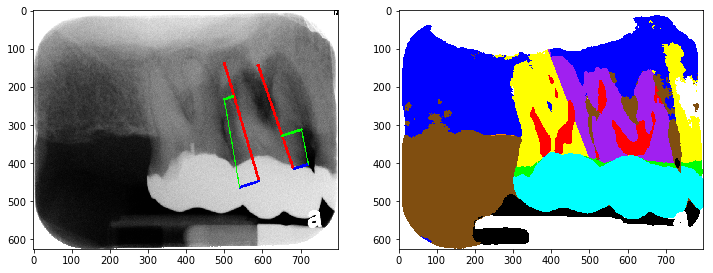

15 : NN_120910_140619_C0A7F8
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3562 | 3D           |       3 | 3_L                 |      22.719 |           2 | NN_120910_140619_C0A7F8_1.PNG |
| 3563 | 3M           |       3 | 3_R                 |      32.208 |           2 | NN_120910_140619_C0A7F8_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_LR', '4_LR', '5_LR']


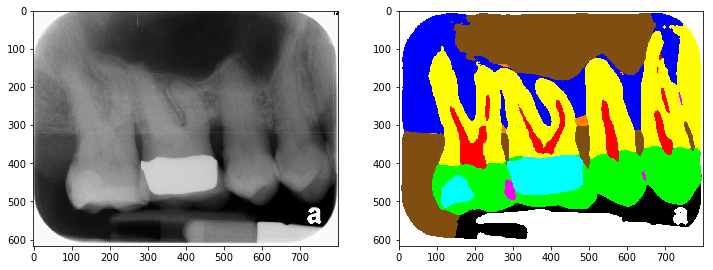

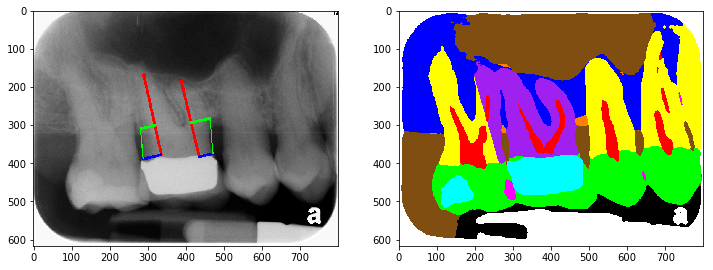

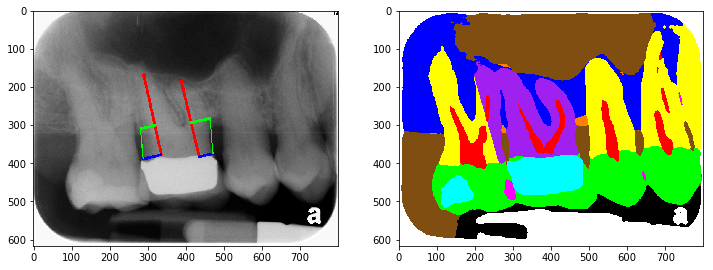

16 : NN_120910_140801_C0A803
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3571 | 3D           |       3 | 3_L                 |      14.638 |           1 | NN_120910_140801_C0A803_1.PNG |
| 3572 | 3M           |       3 | 3_R                 |      29.744 |           2 | NN_120910_140801_C0A803_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['3_LR', '4_LR', '5_LR']


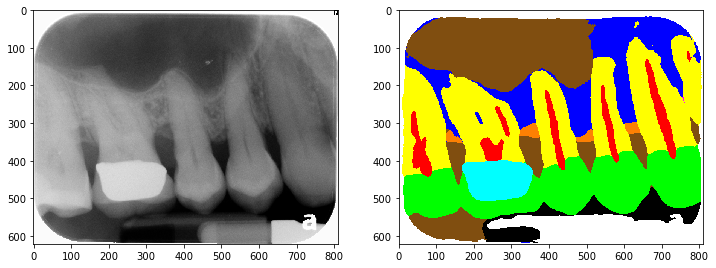

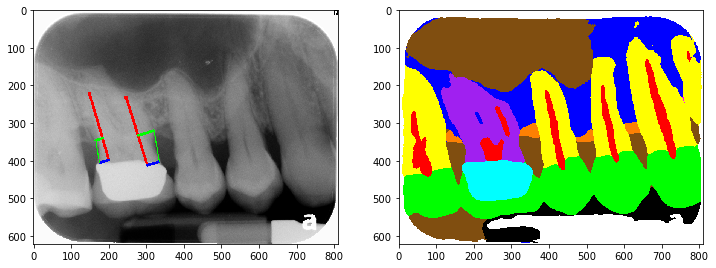

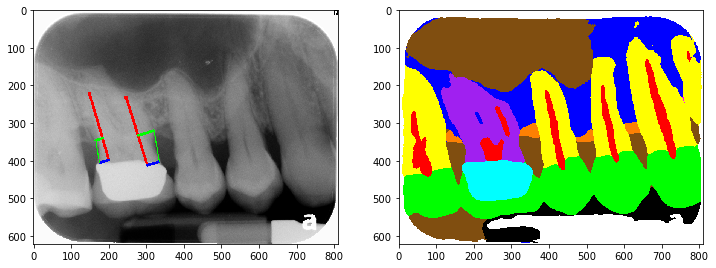

17 : NN_130226_111201_C05502
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 1397 | 4M           |       3 | 4_R                 |      11.645 |           1 | NN_130226_111201_C05502_2.PNG |
| 1398 | 4M           |       3 | 4_R                 |      11.645 |           1 | NN_130226_111201_C05502_2.PNG |
| 1399 | 4M           |       3 | 4_R                 |      11.645 |           1 | NN_130226_111201_C05502_2.PNG |
| 1400 | 4M           |       3 | 4_R                 |      11.645 |           1 | NN_130226_111201_C05502_2.PNG |
| 1401 | 4M           |       3 | 4_R                 |      11.645 |           1 | NN_130226_111201_C05502_2.PNG |
| 1402 | 4M           |       3 | 4_R      

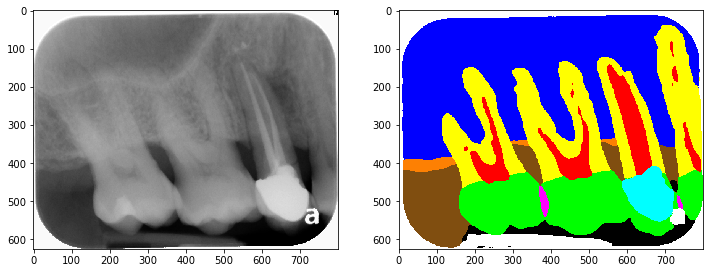

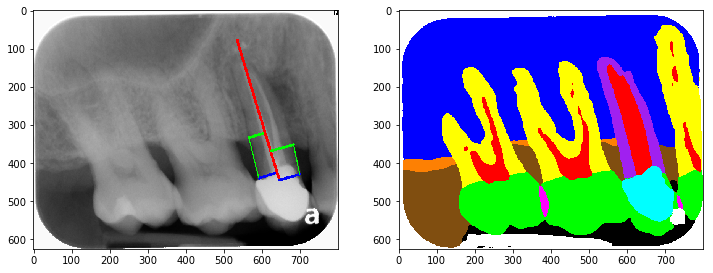

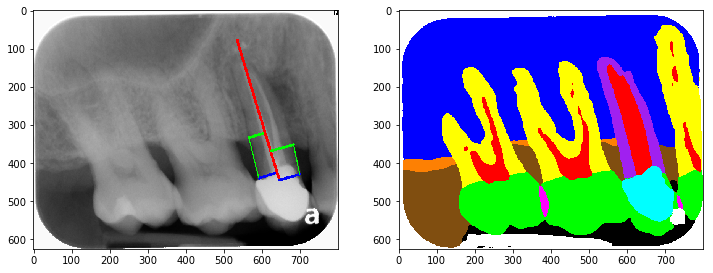

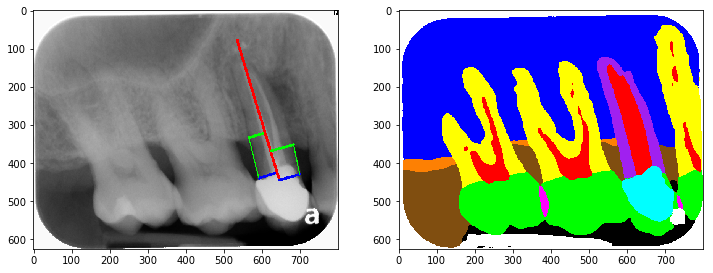

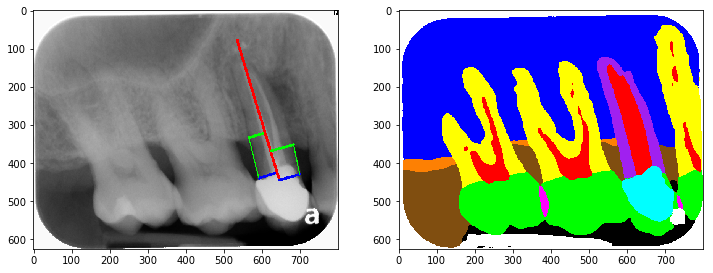

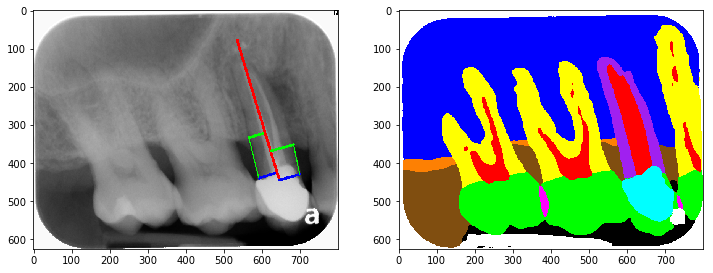

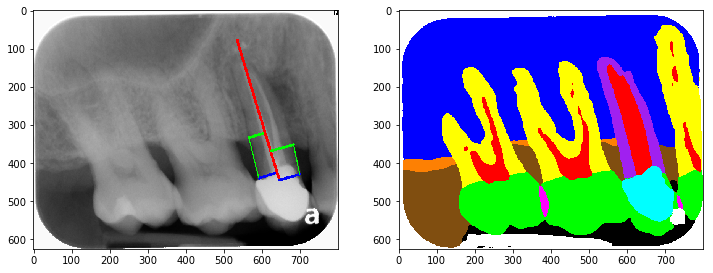

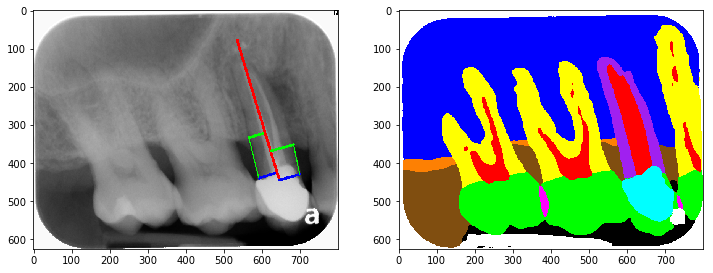

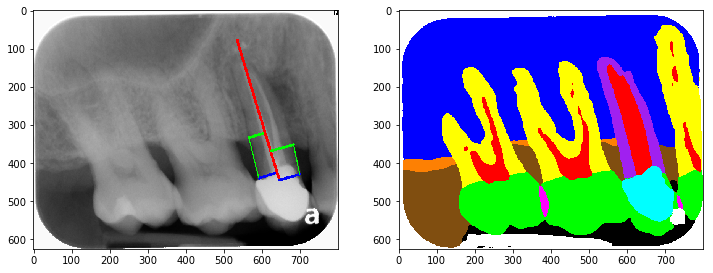

18 : NN_130821_101425_C057C0
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 1614 | 15M          |       3 | 15_L                |      23.481 |           2 | NN_130821_101425_C057C0_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['14_LR', '15_LR', '16_LR']


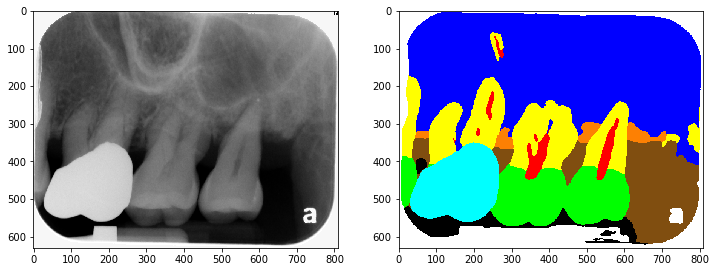

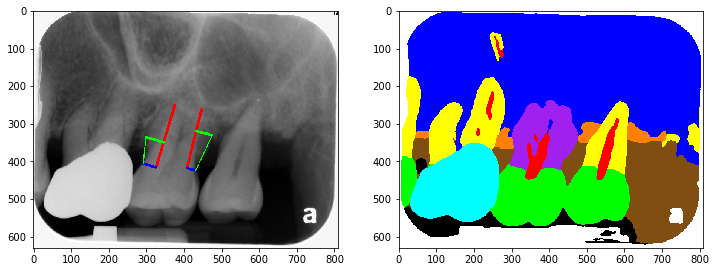

19 : NN_130911_095929_A8C72B
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3525 | 19M          |       3 | 19_L                |      24.463 |           2 | NN_130911_095929_A8C72B_0.PNG |
| 3526 | 19D          |       3 | 19_R                |      34.871 |           3 | NN_130911_095929_A8C72B_0.PNG |
| 3527 | 18M          |       3 | 18_L                |      44.633 |           3 | NN_130911_095929_A8C72B_1.PNG |
| 3528 | 18D          |       3 | 18_R                |      31.748 |           2 | NN_130911_095929_A8C72B_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['19_LR', '18_LR']


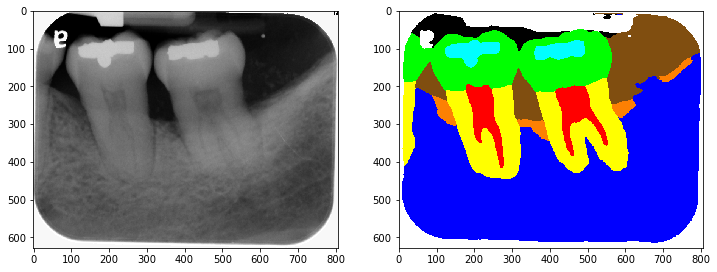

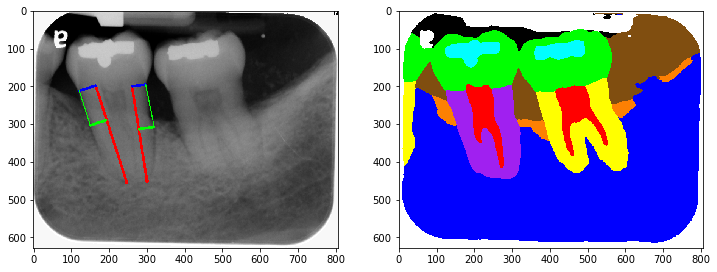

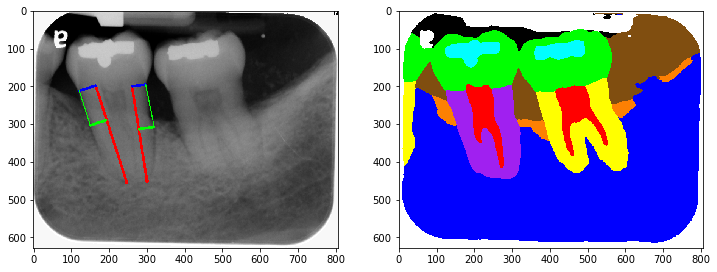

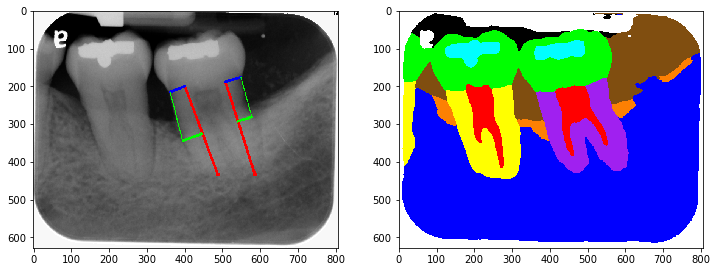

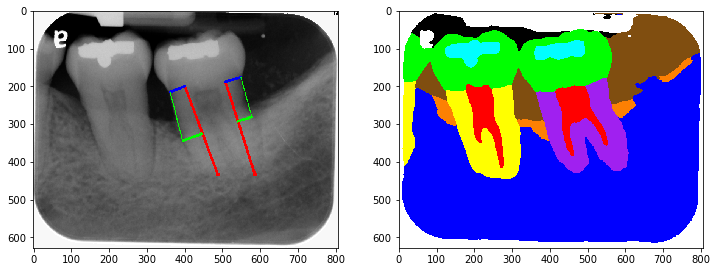

20 : NN_131008_142410_C0378E
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9338 | 31D          |       3 | 31_L                |      12.803 |           1 | NN_131008_142410_C0378E_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['31_LR', '29_LR']


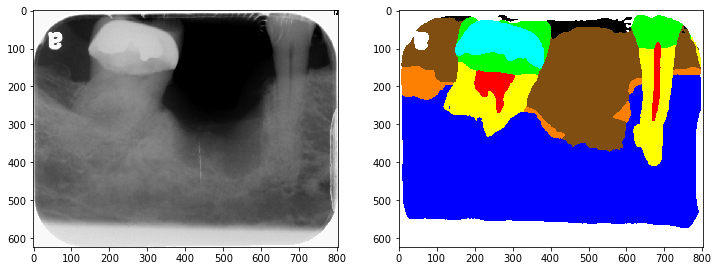

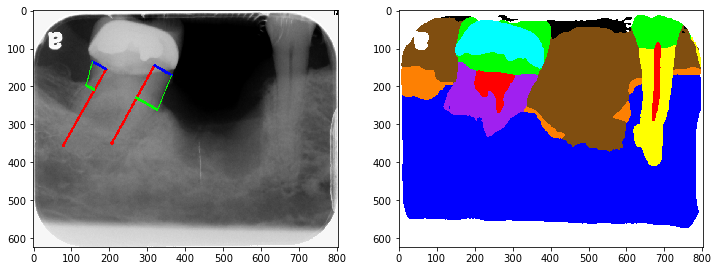

21 : NN_131030_103340_EA98A
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 4112 | 14M          |       3 | 14_L                |      15.321 |           2 | NN_131030_103340_EA98A_1.PNG |
| 4113 | 14D          |       3 | 14_R                |      10.834 |           1 | NN_131030_103340_EA98A_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['13_LR', '14_LR']


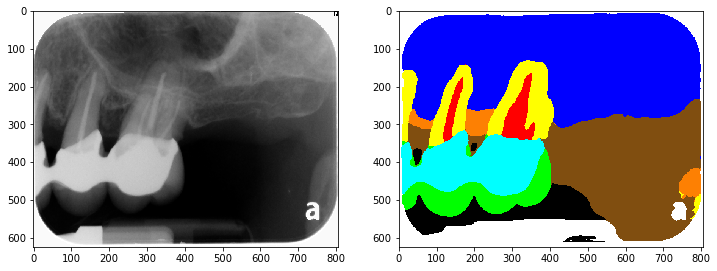

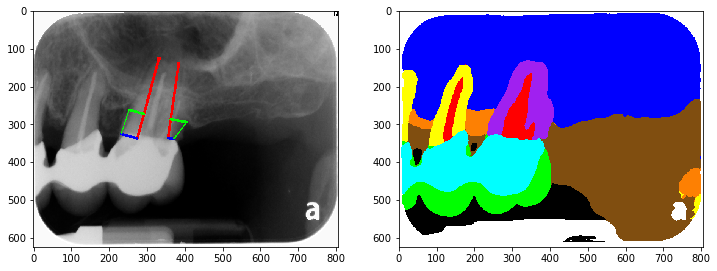

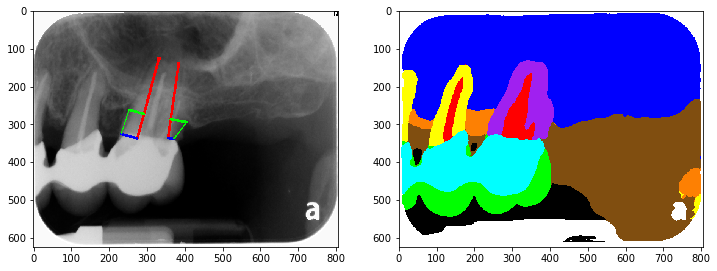

22 : NN_140108_140918_C06BB5
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9415 | 3M           |       3 | 3_R                 |      25.035 |           2 | NN_140108_140918_C06BB5_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_LR', '4_LR', '5_L']


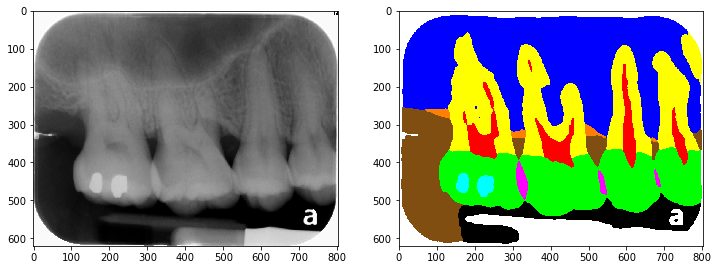

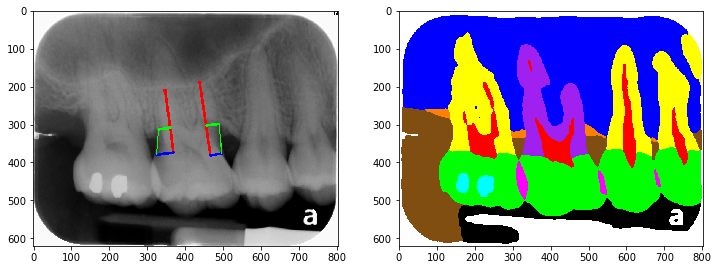

23 : NN_140609_112257_C0A542
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3738 | 13M          |       3 | 13_L                |      43.444 |           3 | NN_140609_112257_C0A542_2.PNG |
| 3739 | 13D          |       3 | 13_R                |      16.845 |           2 | NN_140609_112257_C0A542_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['11_LR', '12_LR', '13_LR', '14_LR', '15_LR']


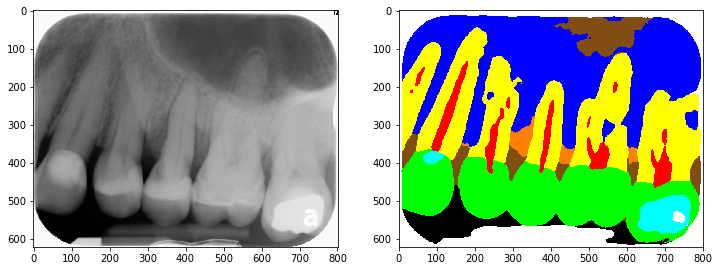

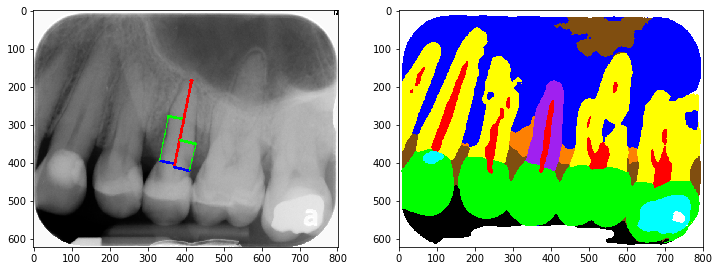

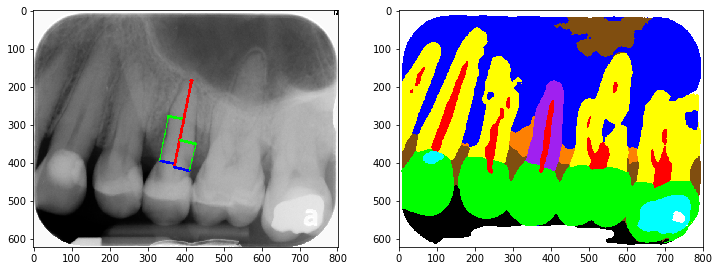

24 : NN_140908_151544_A53217
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9539 | 18D          |       3 | 18_R                |      15.069 |           2 | NN_140908_151544_A53217_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['18_LR']


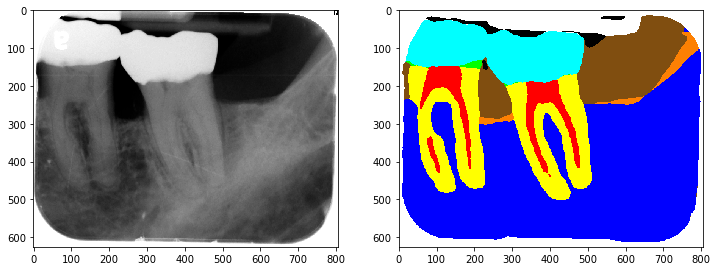

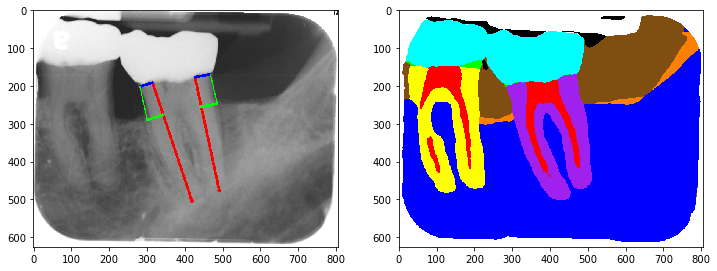

25 : NN_140908_151614_A53215
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9546 | 2M           |       3 | 2_R                 |      50.258 |           3 | NN_140908_151614_A53215_0.PNG |
| 9547 | 3D           |       3 | 3_L                 |      20.489 |           2 | NN_140908_151614_A53215_1.PNG |
| 9548 | 3M           |       3 | 3_R                 |      57.73  |           3 | NN_140908_151614_A53215_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_LR']


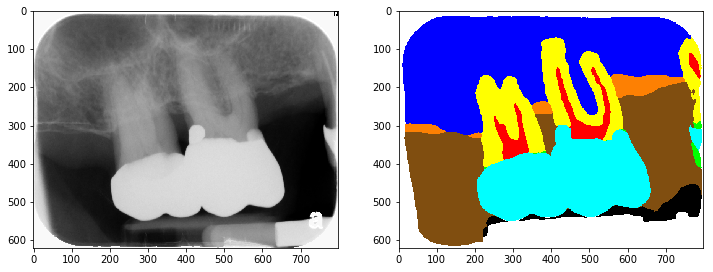

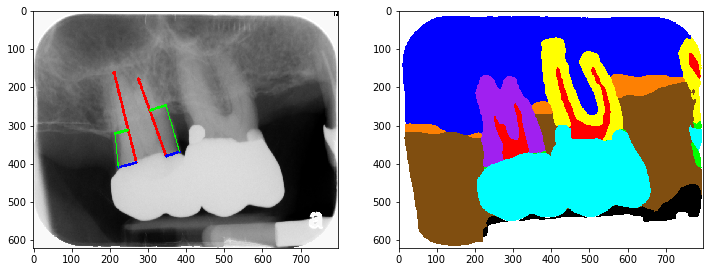

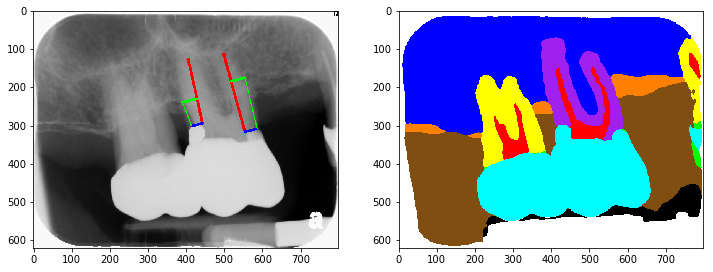

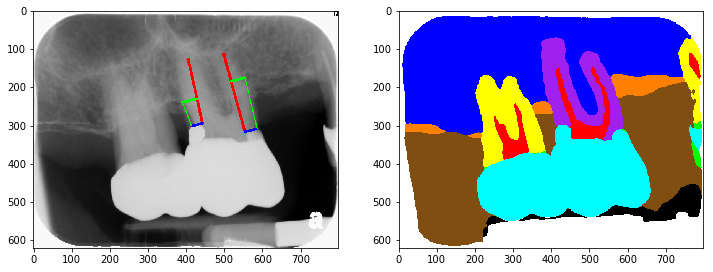

26 : NN_150202_150905_9D8A49
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3934 | 18D          |       3 | 18_R                |        3.21 |           1 | NN_150202_150905_9D8A49_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['21_LR', '20_LR', '19_LR', '18_LR']


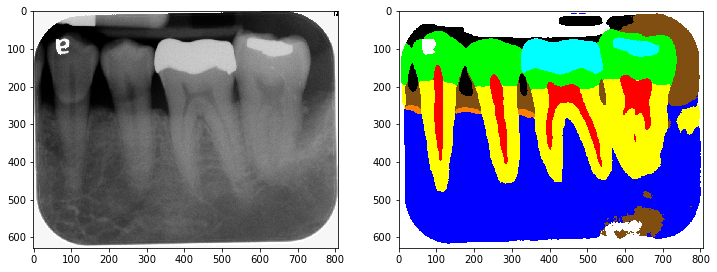

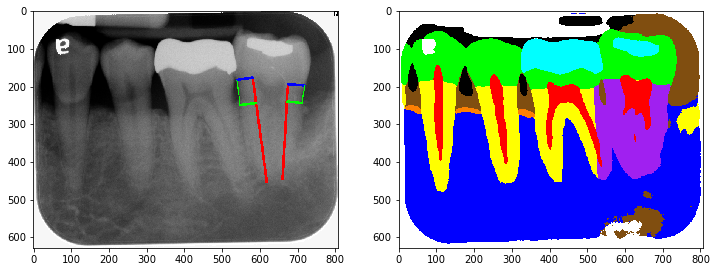

27 : NN_150413_144723_9B50CB
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9865 | 14D          |       3 | 14_R                |       8.903 |           1 | NN_150413_144723_9B50CB_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['14_LR']


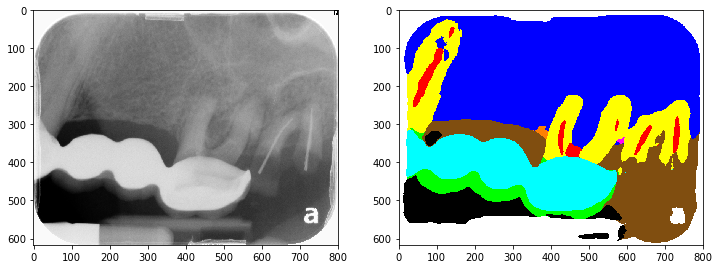

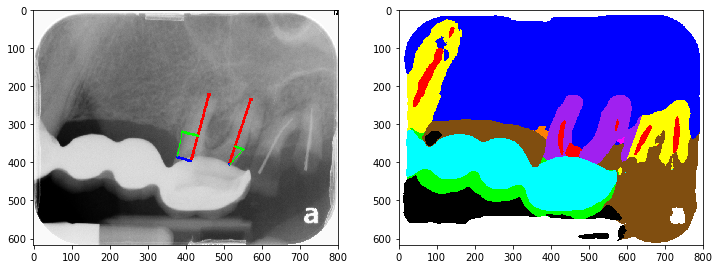

28 : NN_150413_144726_9B50D2
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9866 | 14M          |       3 | 14_L                |       5.039 |           1 | NN_150413_144726_9B50D2_1.PNG |
| 9867 | 14D          |       3 | 14_R                |      47.242 |           3 | NN_150413_144726_9B50D2_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['14_LR']


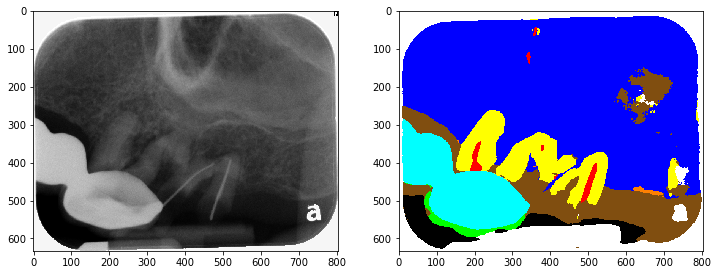

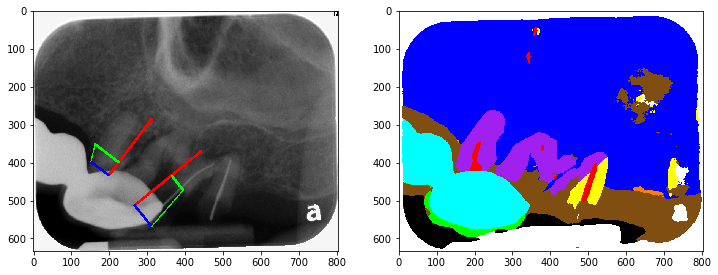

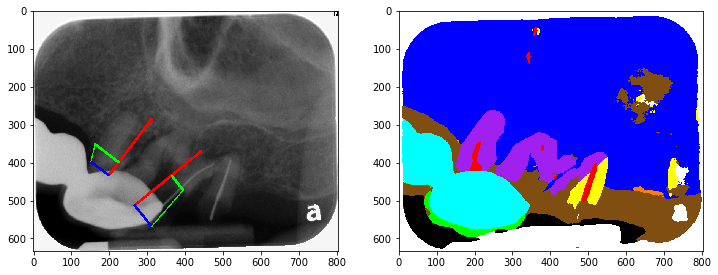

29 : NN_150701_113047_C0376A
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9306 | 2D           |       3 | 2_L                 |      51.709 |           3 | NN_150701_113047_C0376A_0.PNG |
| 9307 | 2M           |       3 | 2_R                 |       7.952 |           1 | NN_150701_113047_C0376A_0.PNG |
| 9308 | 3D           |       3 | 3_L                 |      19.481 |           2 | NN_150701_113047_C0376A_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_LR', '4_LR', '5_LR']


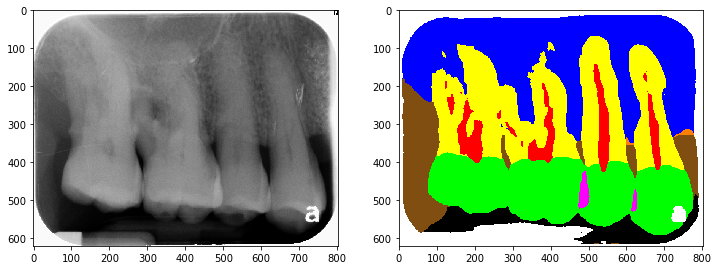

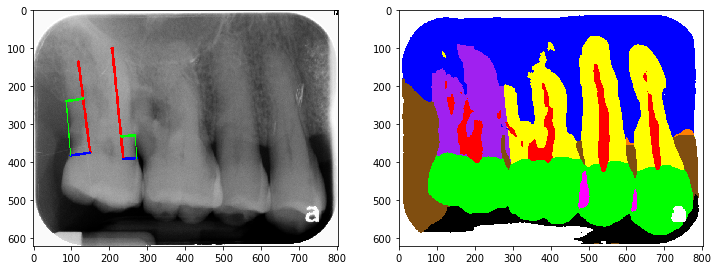

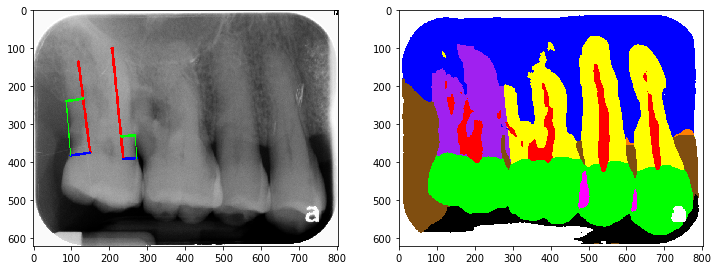

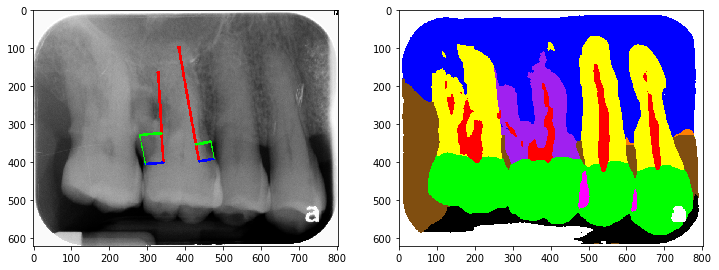

30 : NN_151007_102729_C04FFB
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9622 | 7M           |       3 | 7_R                 |       24.71 |           2 | NN_151007_102729_C04FFB_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['6_R', '7_LR']


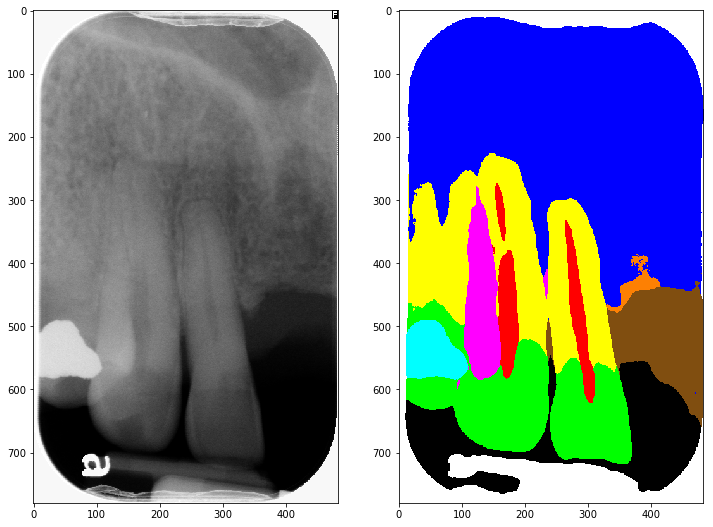

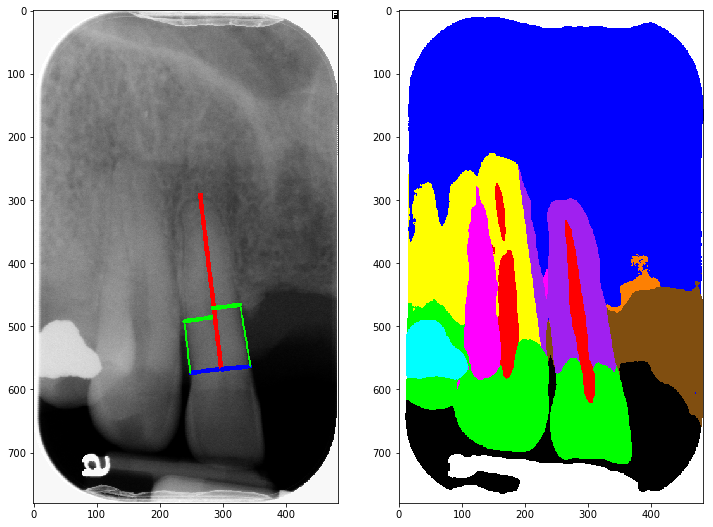

31 : NN_151007_110355_C05003
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9640 | 14M          |       3 | 14_L                |      56.73  |           3 | NN_151007_110355_C05003_2.PNG |
| 9641 | 14D          |       3 | 14_R                |      19.447 |           2 | NN_151007_110355_C05003_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['14_LR']


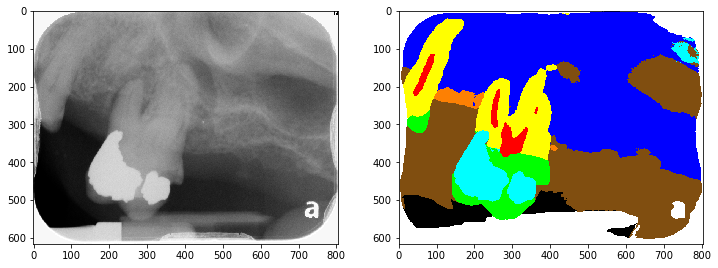

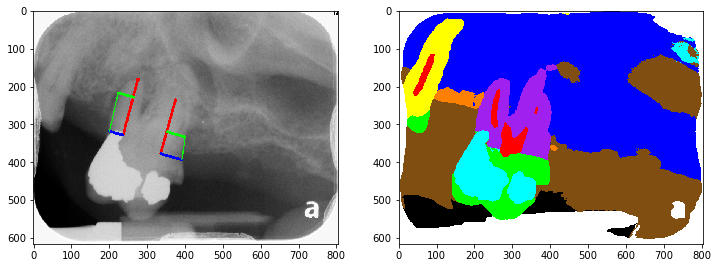

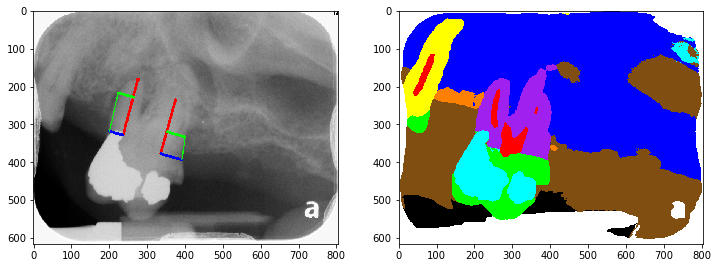

32 : NN_151007_111647_C04FF5
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9644 | 3D           |       3 | 3_L                 |      19.451 |           2 | NN_151007_111647_C04FF5_1.PNG |
| 9645 | 3M           |       3 | 3_R                 |      44.361 |           3 | NN_151007_111647_C04FF5_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '3_LR', '5_LR']


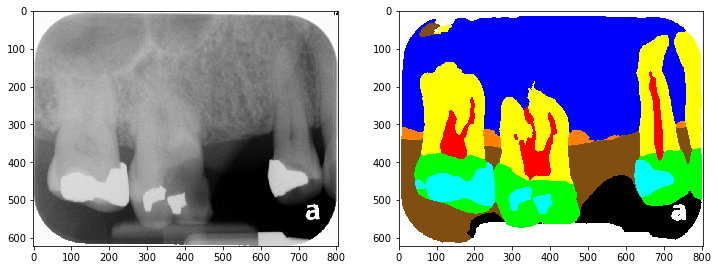

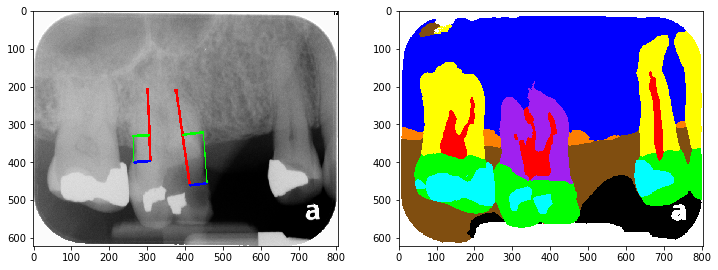

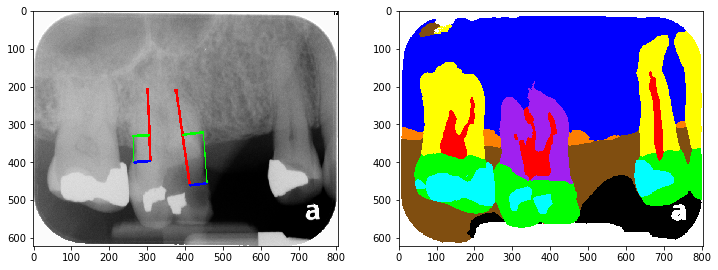

33 : NN_160822_112819_C0268B
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8167 | 2D           |       3 | 2_L                 |      25.296 |           2 | NN_160822_112819_C0268B_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['1_LR', '2_LR', '3_LR', '4_LR']


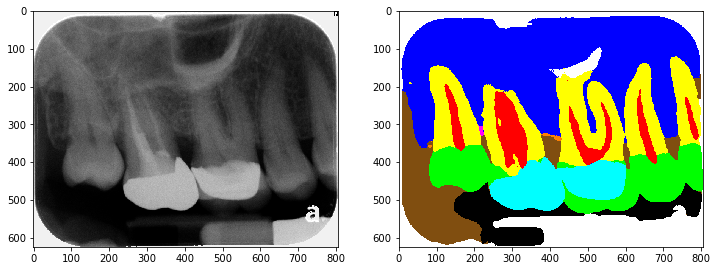

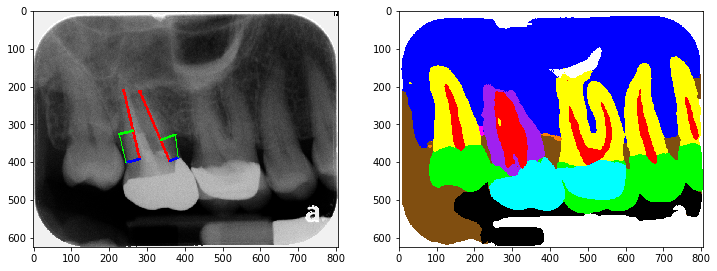

34 : NN_160921_105317_C051BA
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9676 | 26D          |       3 | 26_L                |       9.467 |           1 | NN_160921_105317_C051BA_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['28_R', '27_LR', '26_LR']


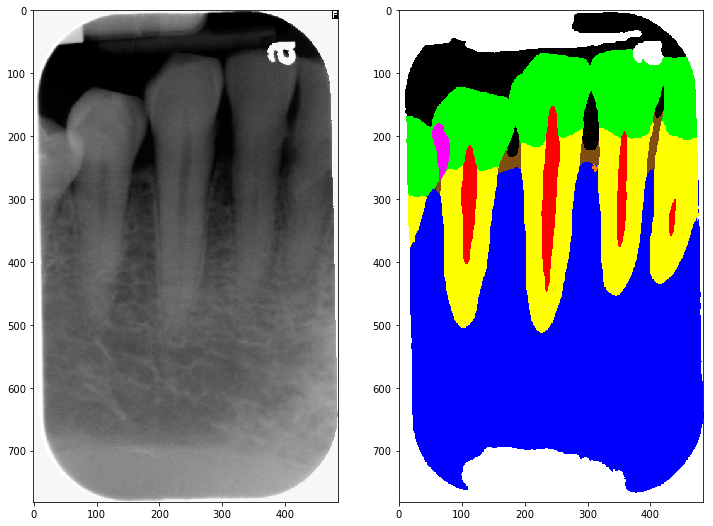

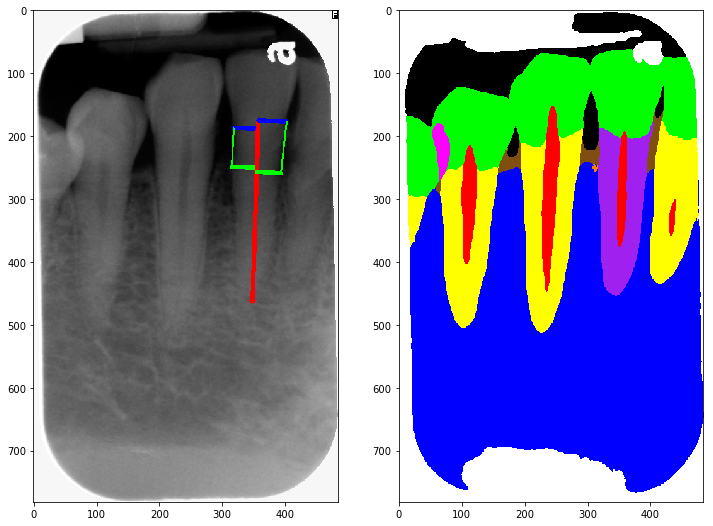

35 : NN_170310_135330_C0A87B
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3916 | 19D          |       3 | 19_R                |       0.958 |           1 | NN_170310_135330_C0A87B_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['20_LR', '19_LR']


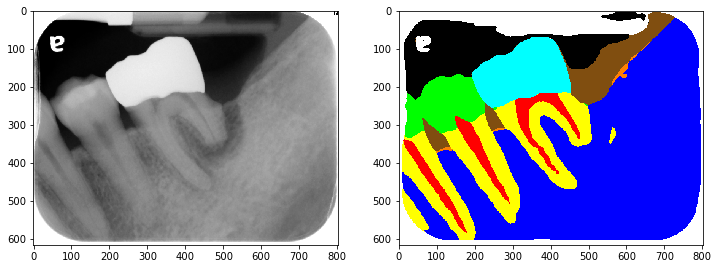

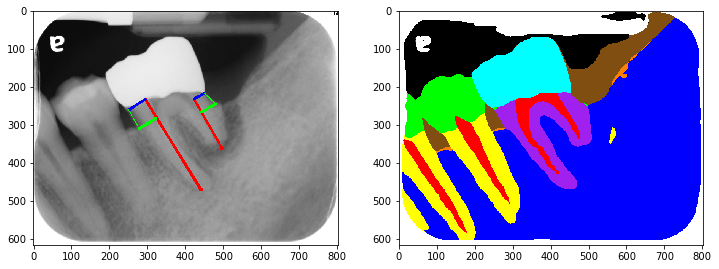

36 : NN_170310_152047_C04CDE
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9503 | 9D           |       3 | 9_R                 |      26.818 |           2 | NN_170310_152047_C04CDE_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['8_LR', '9_LR']


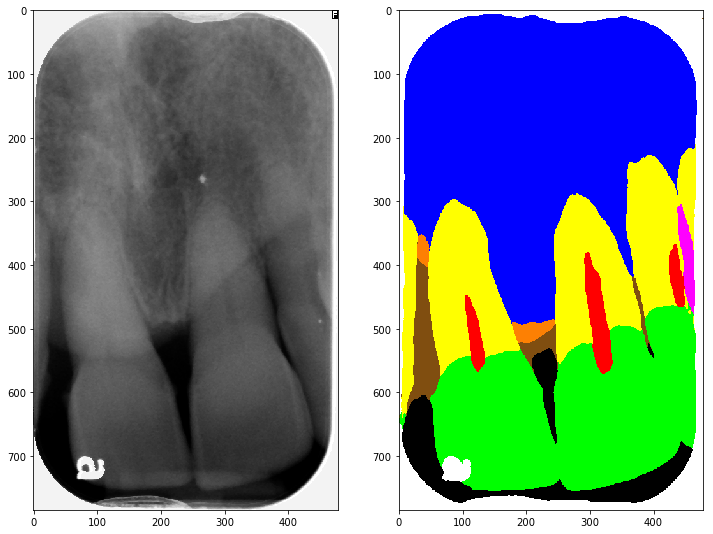

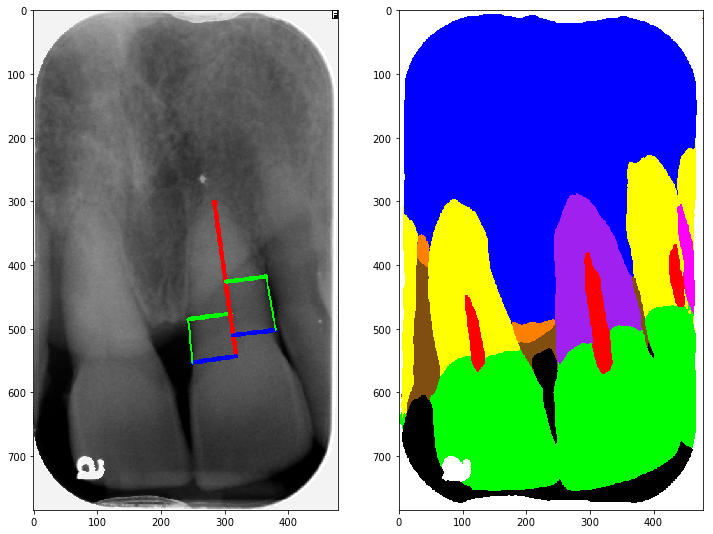

37 : NN_170503_151654_C02D10
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 8663 | 18D          |       3 | 18_R                |       3.423 |           1 | NN_170503_151654_C02D10_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['18_LR']


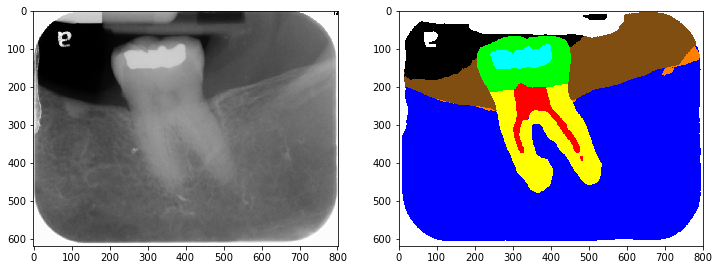

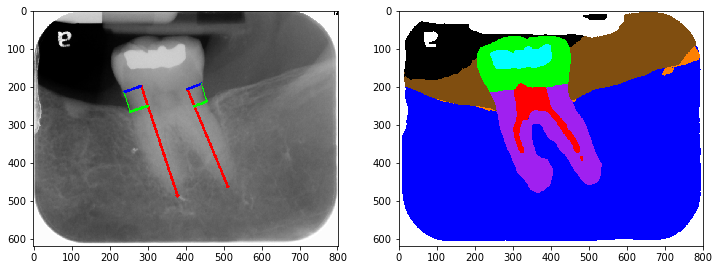

38 : NN_170619_155628_16F2EC
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5194 | 14M          |       3 | 14_L                |      15.747 |           2 | NN_170619_155628_16F2EC_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['13_LR', '14_LR']


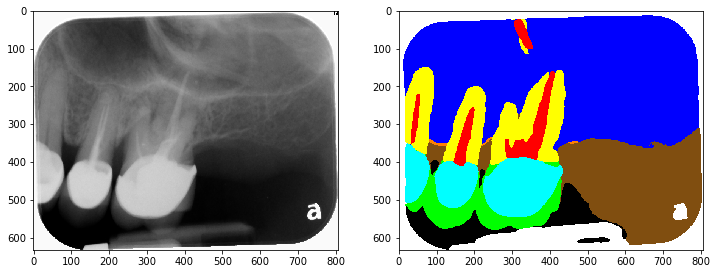

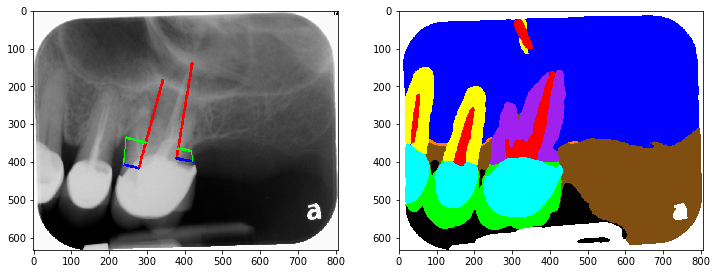

39 : NN_180910_154845_16E145
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 6122 | 12D          |       3 | 12_R                |      25.831 |           2 | NN_180910_154845_16E145_2.PNG |
| 6123 | 13D          |       3 | 13_R                |      37.676 |           3 | NN_180910_154845_16E145_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR', '13_LR', '14_LR']


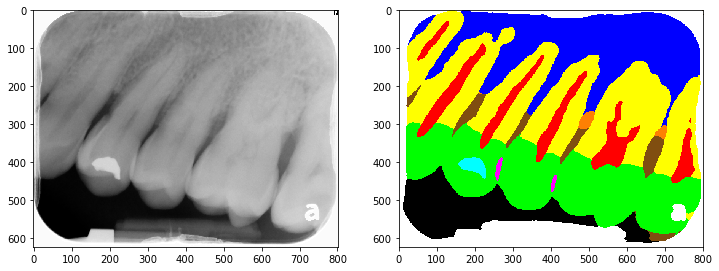

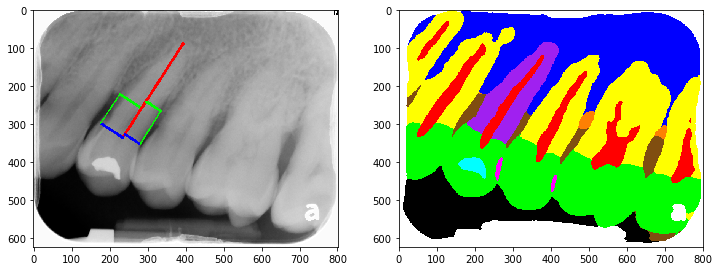

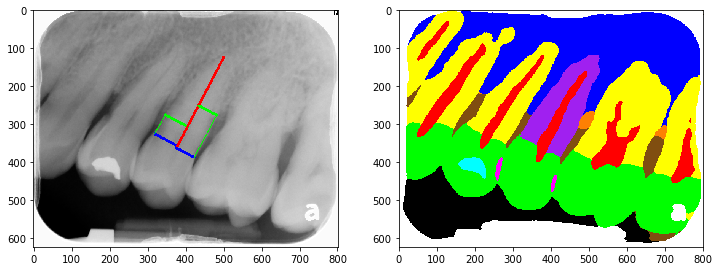

40 : NN_180913_104247_16EA61
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 6783 | 12M          |       3 | 12_L                |      16.735 |           2 | NN_180913_104247_16EA61_1.PNG |
| 6784 | 12D          |       3 | 12_R                |      31.549 |           2 | NN_180913_104247_16EA61_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR']


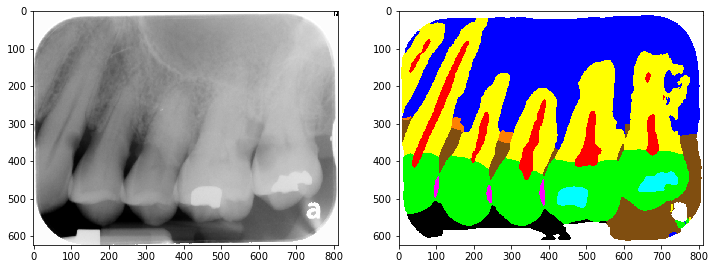

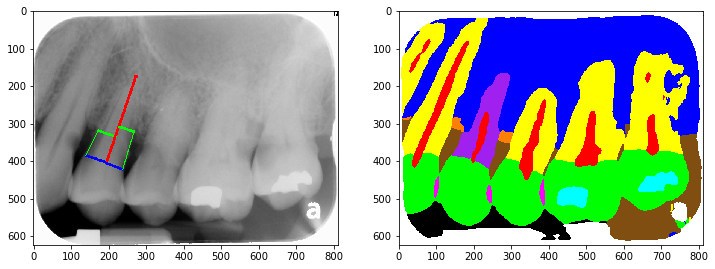

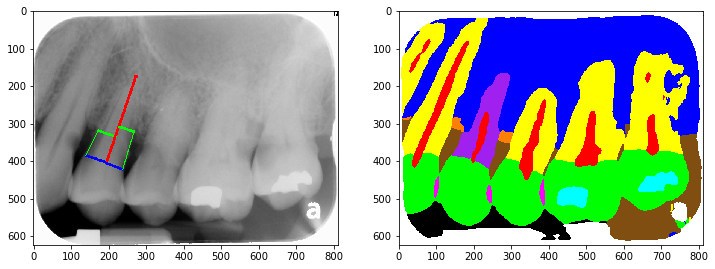

41 : NN_180921_140718_9B0A6D
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9575 | 13M          |       3 | 13_L                |      11.521 |           1 | NN_180921_140718_9B0A6D_3.PNG |
| 9576 | 13D          |       3 | 13_R                |      59.668 |           3 | NN_180921_140718_9B0A6D_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['11_LR', '12_LR', '13_LR']


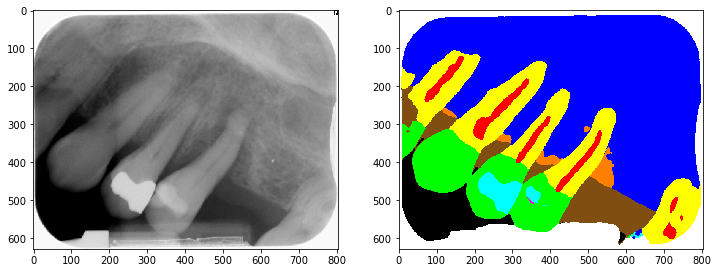

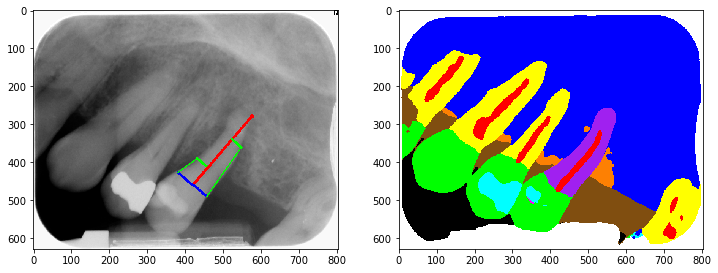

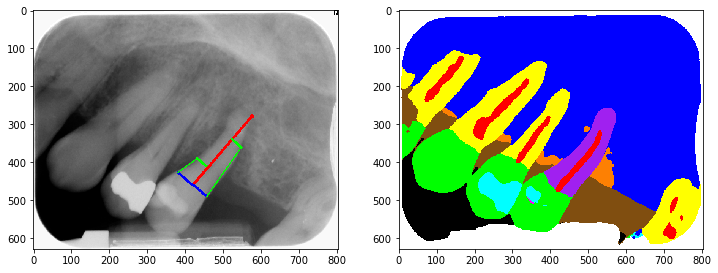

42 : NN_181017_160958_171A23
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 5367 | 3M           |       3 | 3_R                 |      26.969 |           2 | NN_181017_160958_171A23_0.PNG |
| 5368 | 5M           |       3 | 5_R                 |      45.623 |           3 | NN_181017_160958_171A23_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['3_LR', '5_LR']


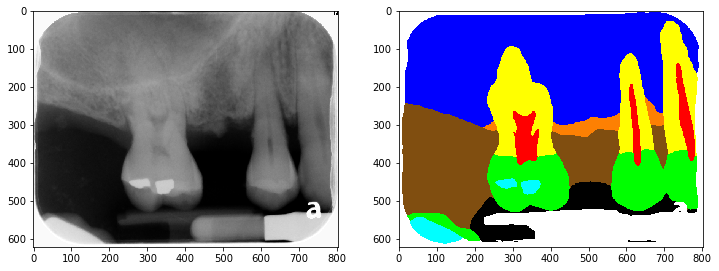

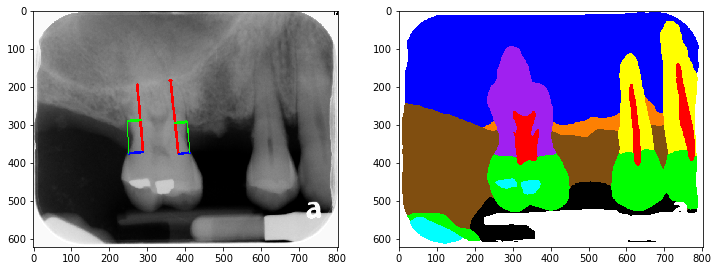

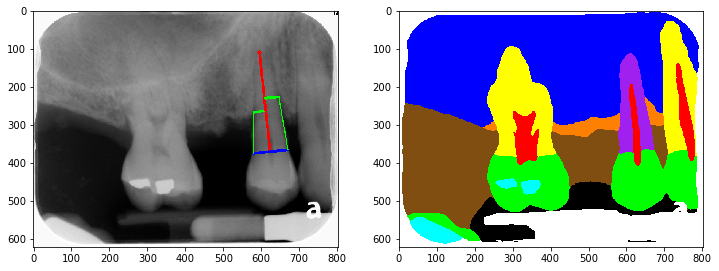

43 : NN_181206_104406_15C7FB
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3217 | 26D          |       3 | 26_L                |      46.585 |           3 | NN_181206_104406_15C7FB_1.PNG |
| 3219 | 25D          |       3 | 25_L                |      22.739 |           2 | NN_181206_104406_15C7FB_2.PNG |
| 3220 | 25M          |       3 | 25_R                |      37.475 |           3 | NN_181206_104406_15C7FB_2.PNG |
| 3221 | 24M          |       3 | 24_L                |      38.518 |           3 | NN_181206_104406_15C7FB_3.PNG |
| 3222 | 24D          |       3 | 24_R                |      22.857 |           2 | NN_181206_104406_15C7FB_3.PNG |
+------+--------------+---------+----------

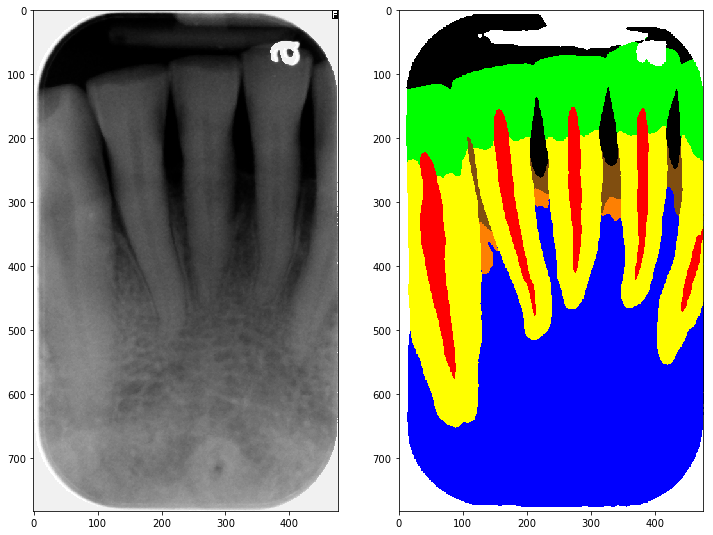

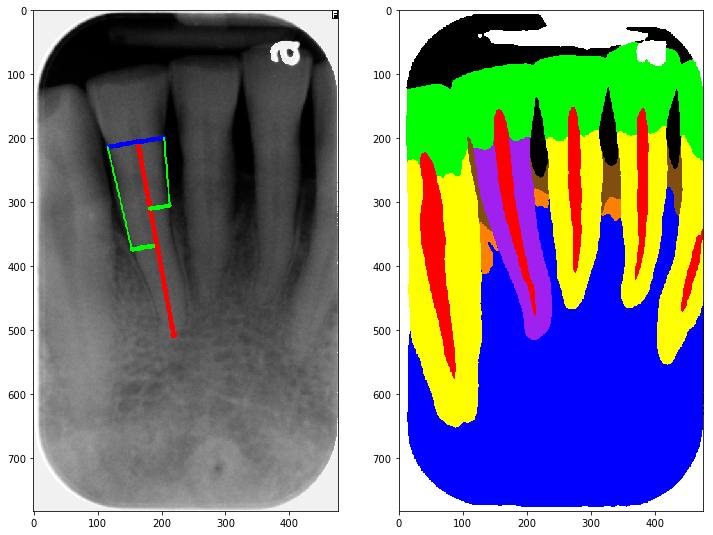

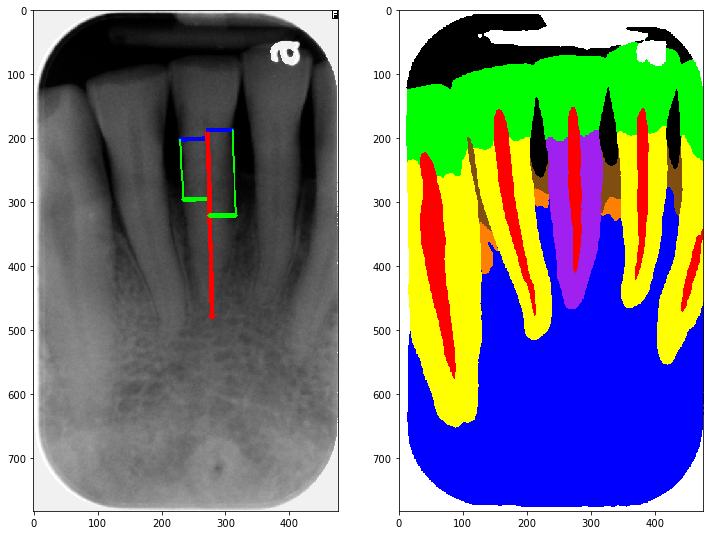

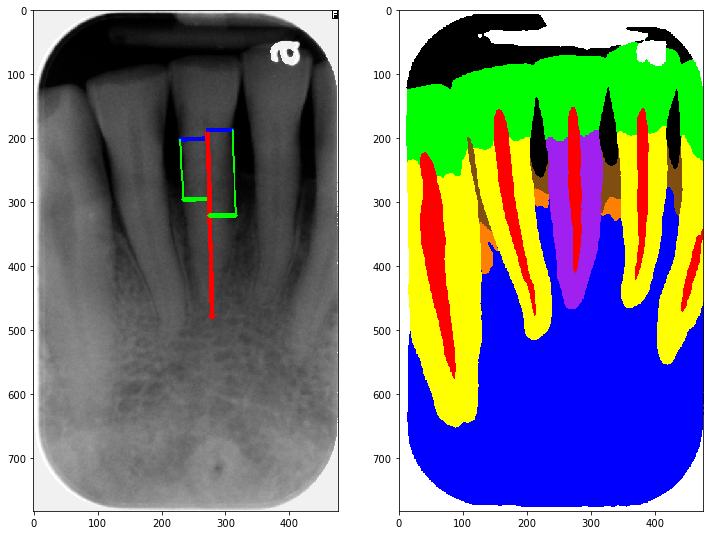

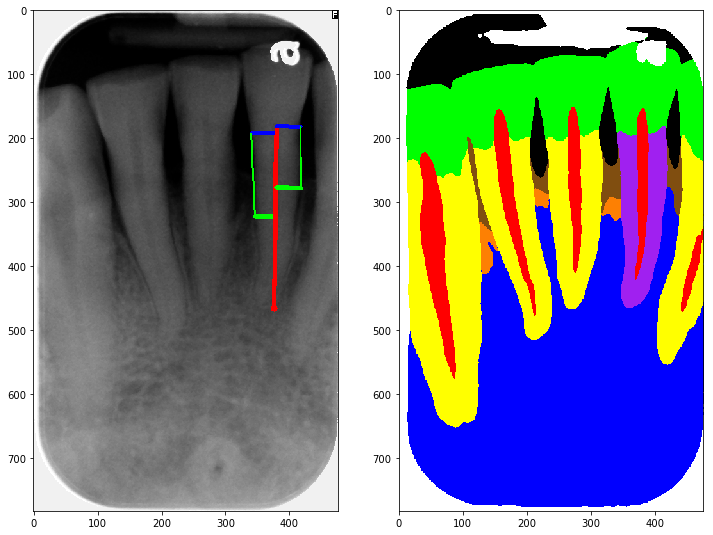

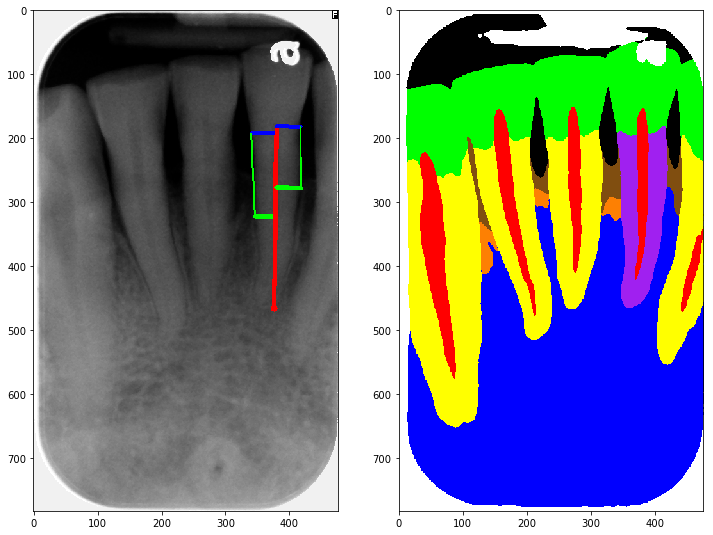

44 : NN_181206_104508_15C7E9
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3233 | 2D           |       3 | 2_L                 |      21.236 |           2 | NN_181206_104508_15C7E9_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['2_LR', '4_LR', '5_LR']


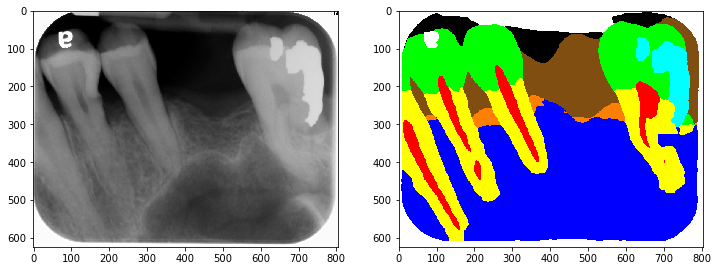

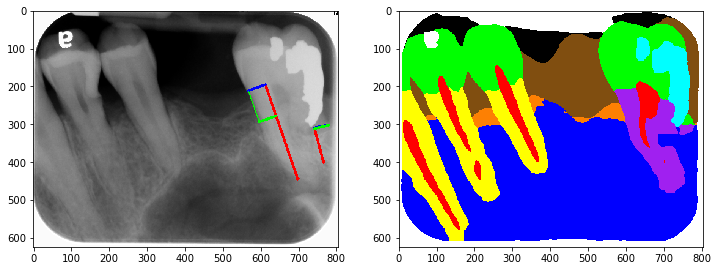

45 : NN_190109_093153_15D397
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3831 | 2D           |       3 | 2_L                 |      67.623 |           3 | NN_190109_093153_15D397_0.PNG |
| 3832 | 2M           |       3 | 2_R                 |      40.18  |           3 | NN_190109_093153_15D397_0.PNG |
| 3833 | 3D           |       3 | 3_L                 |      38.799 |           3 | NN_190109_093153_15D397_1.PNG |
| 3834 | 3M           |       3 | 3_R                 |      19.732 |           2 | NN_190109_093153_15D397_1.PNG |
| 3835 | 4D           |       3 | 4_L                 |      30.885 |           2 | NN_190109_093153_15D397_2.PNG |
| 3836 | 4M           |       3 | 4_R      

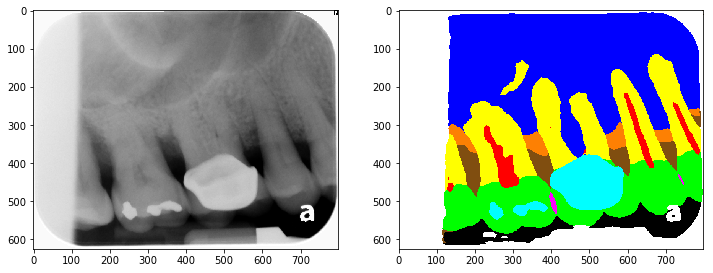

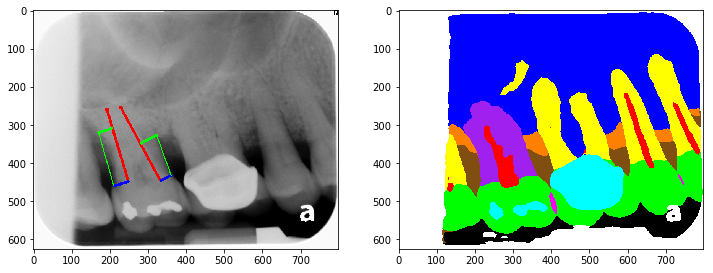

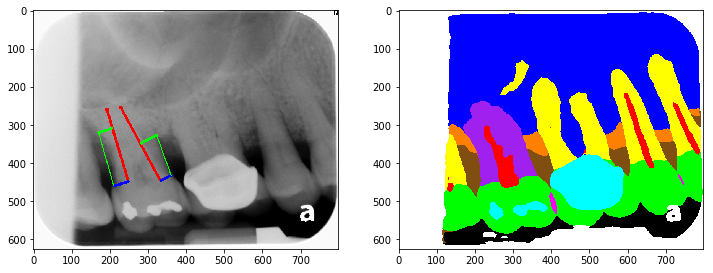

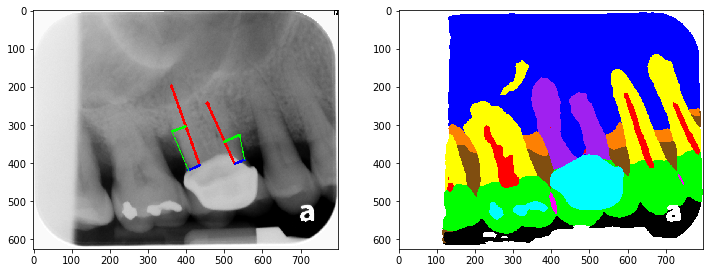

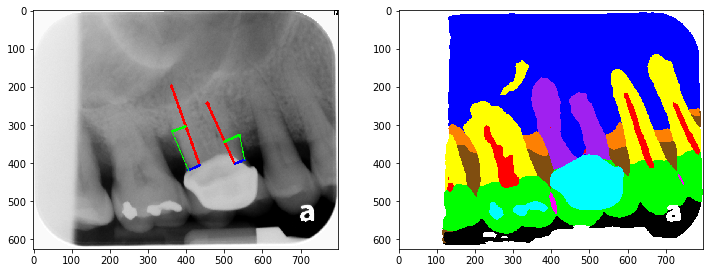

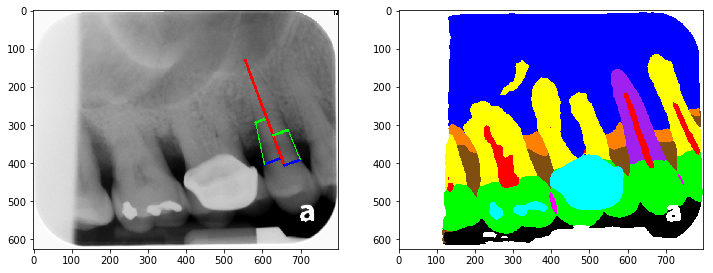

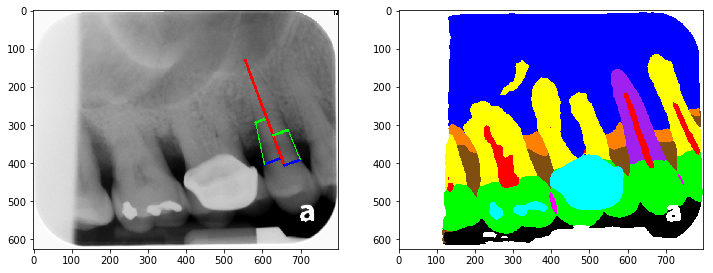

46 : NN_190116_134119_15C25F
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 4097 | 26D          |       3 | 26_L                |      24.043 |           2 | NN_190116_134119_15C25F_0.PNG |
| 4098 | 26M          |       3 | 26_R                |      34.083 |           3 | NN_190116_134119_15C25F_0.PNG |
| 4100 | 25M          |       3 | 25_R                |      49.826 |           3 | NN_190116_134119_15C25F_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['26_LR', '25_LR', '24_LR', '23_LR']


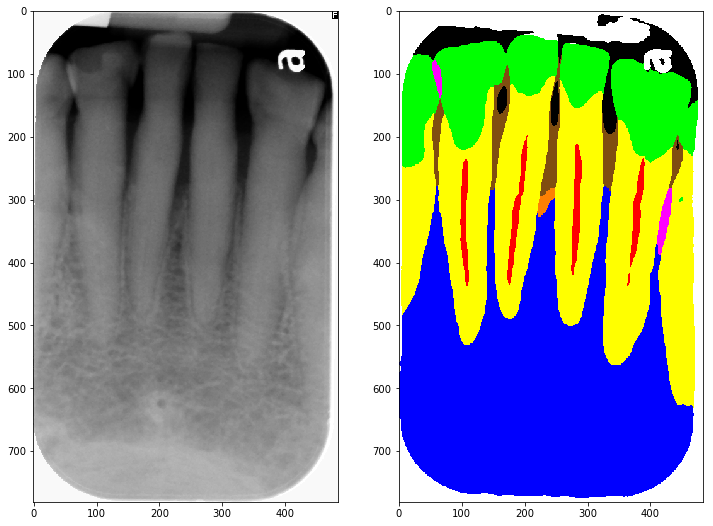

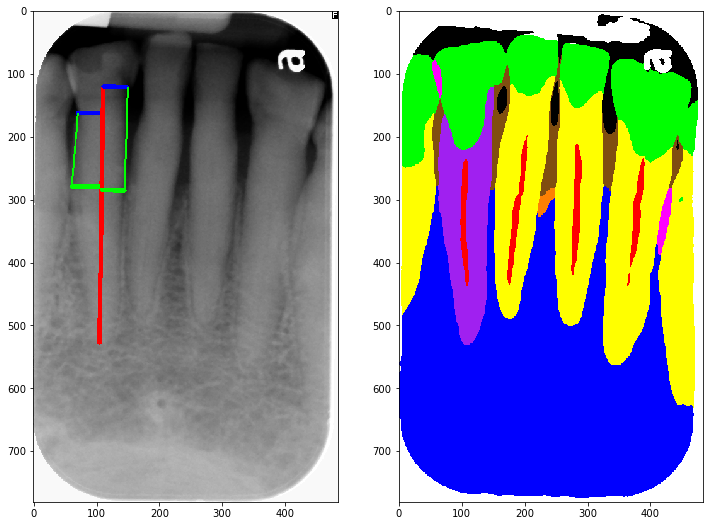

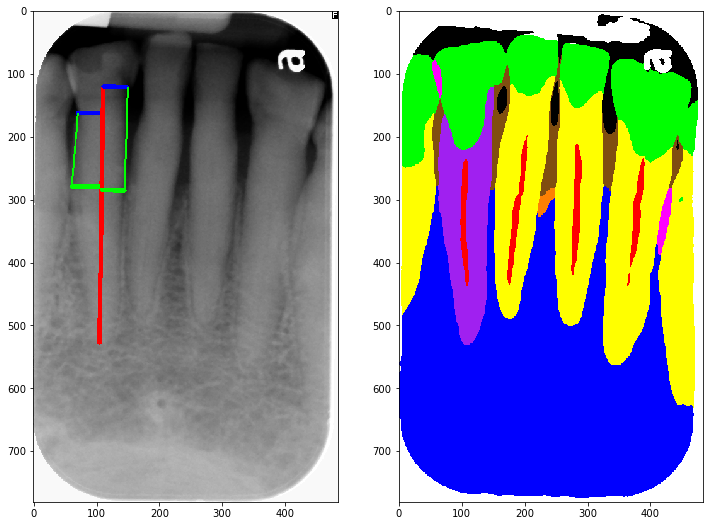

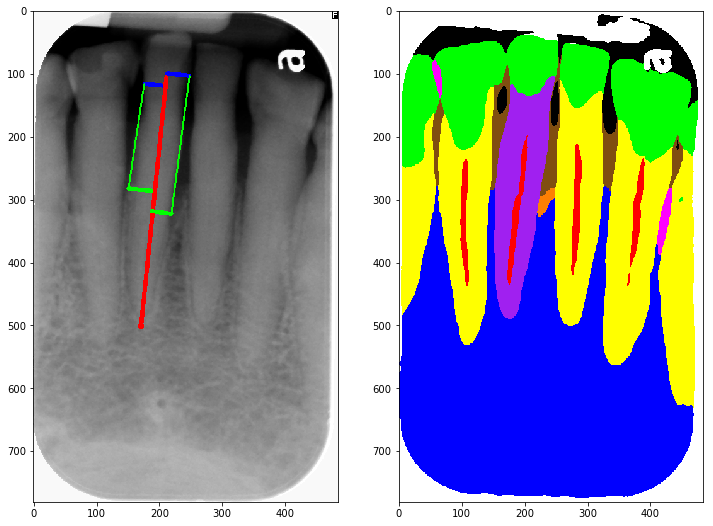

47 : NN_190123_144049_15D4ED
+-------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|       | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|-------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 10001 | 26M          |       3 | 26_R                |      24.108 |           2 | NN_190123_144049_15D4ED_1.PNG |
| 10003 | 25M          |       3 | 25_R                |      37.306 |           3 | NN_190123_144049_15D4ED_2.PNG |
| 10004 | 24M          |       3 | 24_L                |      37.654 |           3 | NN_190123_144049_15D4ED_3.PNG |
| 10005 | 24D          |       3 | 24_R                |      53.641 |           3 | NN_190123_144049_15D4ED_3.PNG |
| 10006 | 23M          |       3 | 23_L                |      49.594 |           3 | NN_190123_144049_15D4ED_4.PNG |
+-------+--------------+---------+-

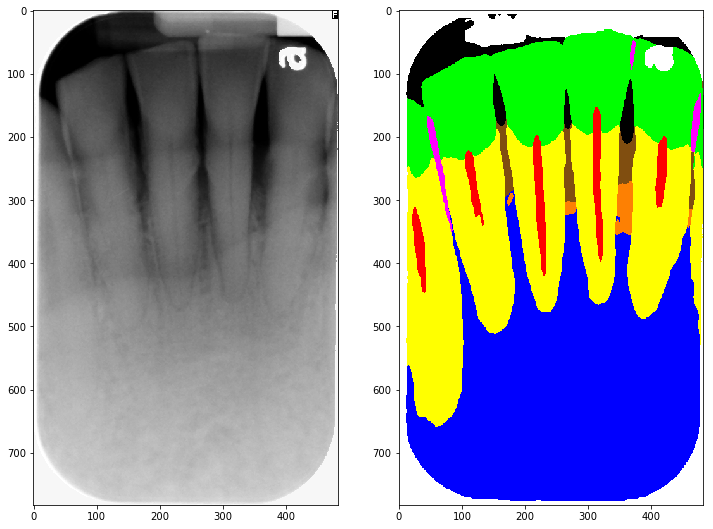

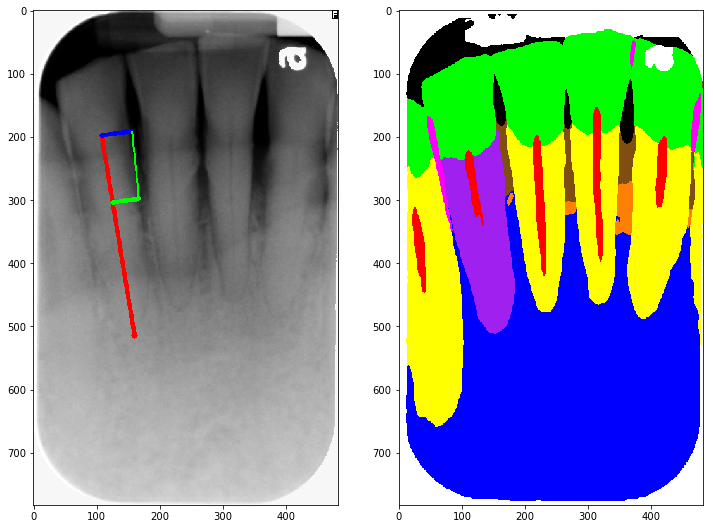

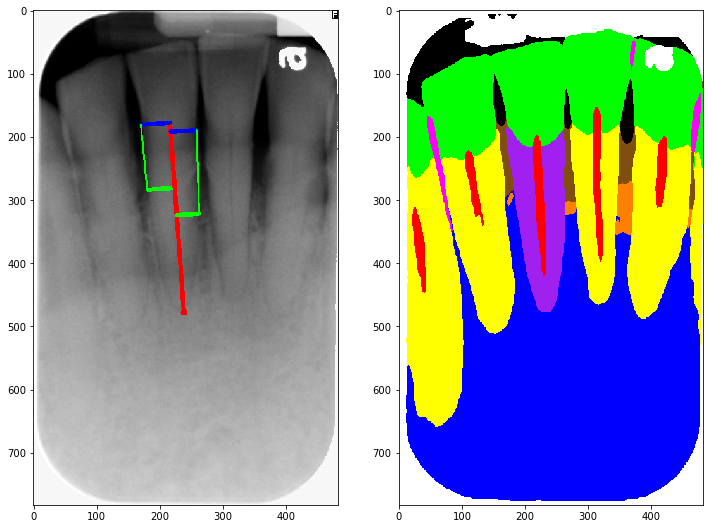

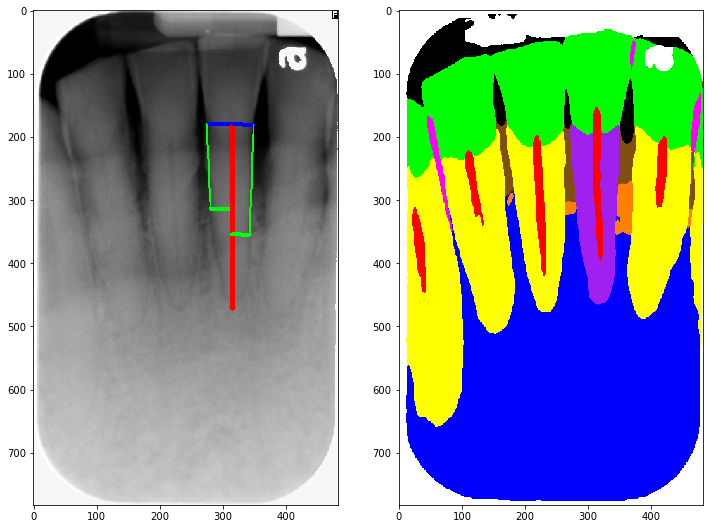

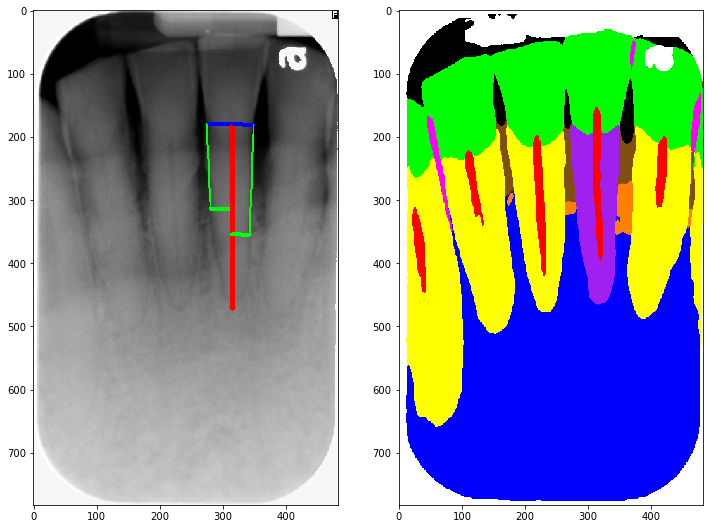

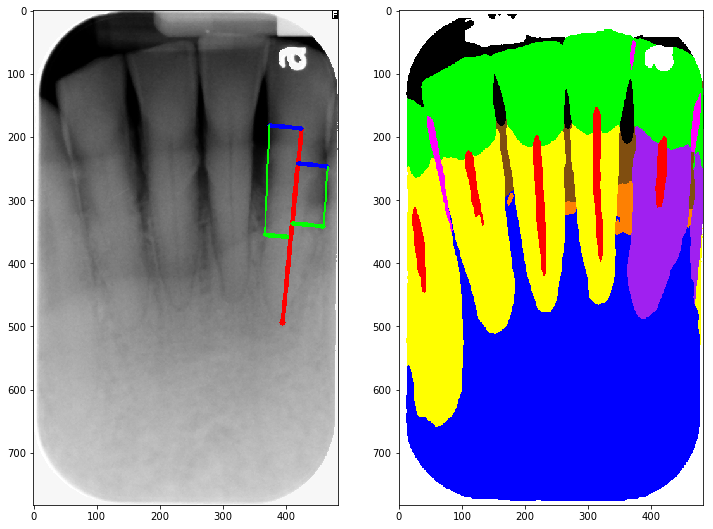

48 : NN_190228_155903_EB842
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 3307 | 31D          |       3 | 31_L                |      18.655 |           2 | NN_190228_155903_EB842_0.PNG |
| 3308 | 31M          |       3 | 31_R                |      36.782 |           3 | NN_190228_155903_EB842_0.PNG |
| 3309 | 30D          |       3 | 30_L                |      34.264 |           3 | NN_190228_155903_EB842_1.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['31_LR', '30_LR']


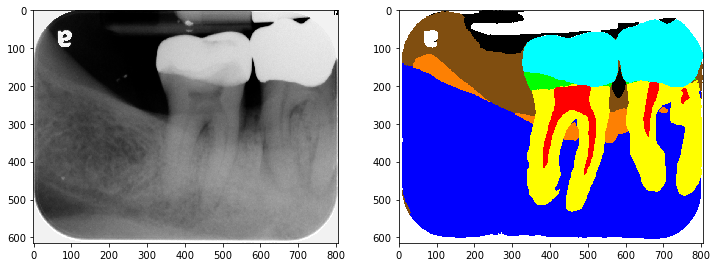

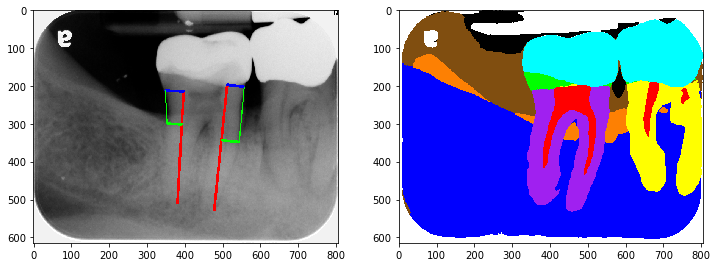

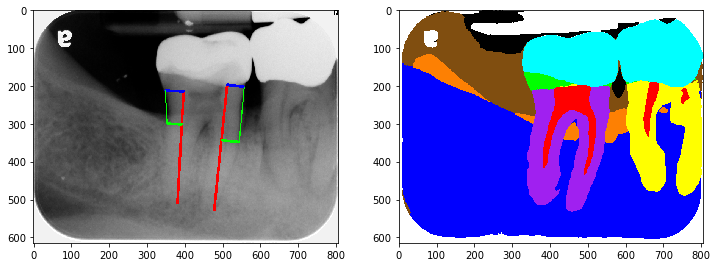

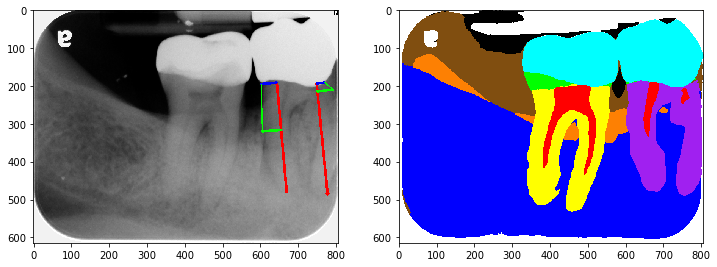

49 : NN_190410_101514_AC0ECD
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3544 | 31D          |       3 | 31_L                |      22.41  |           2 | NN_190410_101514_AC0ECD_0.PNG |
| 3545 | 31M          |       3 | 31_R                |      45.171 |           3 | NN_190410_101514_AC0ECD_0.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['31_LR', '29_LR', '28_LR', '27_LR']


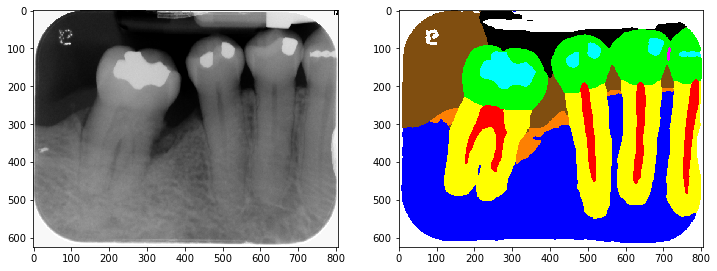

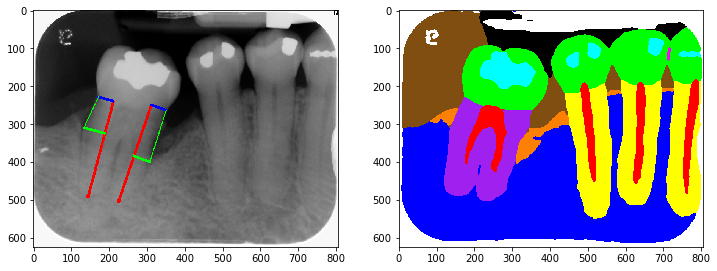

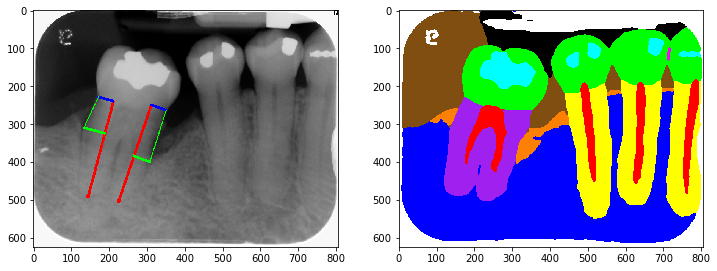

50 : NN_190410_101519_AC0ECE
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 3556 | 19M          |       3 | 19_L                |      17.373 |           2 | NN_190410_101519_AC0ECE_3.PNG |
| 3557 | 19D          |       3 | 19_R                |      46.612 |           3 | NN_190410_101519_AC0ECE_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['22_R', '21_LR', '20_LR', '19_LR']


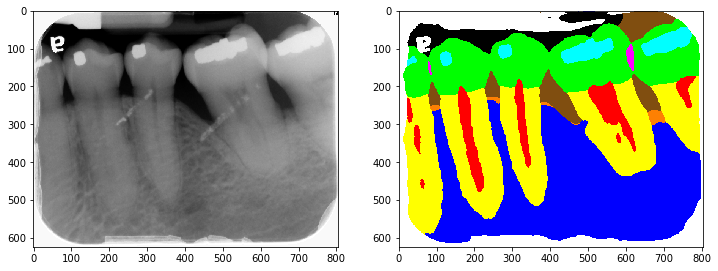

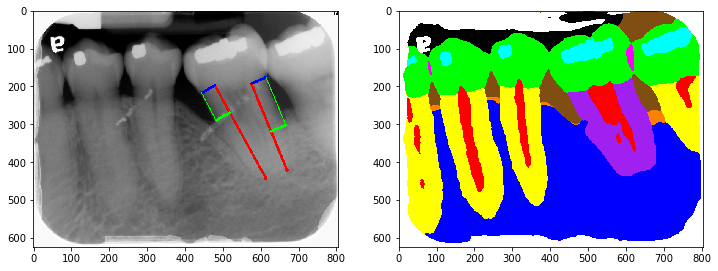

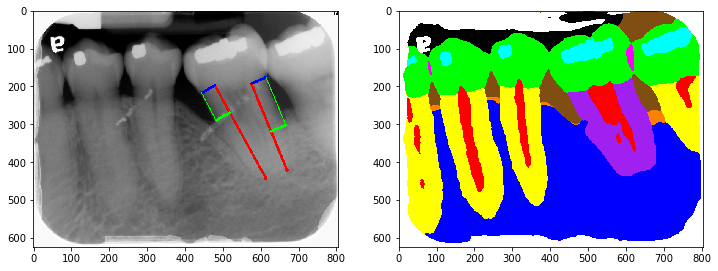

51 : NN_190611_101348_6A7E7
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 7098 | 13M          |       3 | 13_L                |       5.738 |           1 | NN_190611_101348_6A7E7_2.PNG |
| 7099 | 13D          |       3 | 13_R                |      51.317 |           3 | NN_190611_101348_6A7E7_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['12_LR', '13_LR']


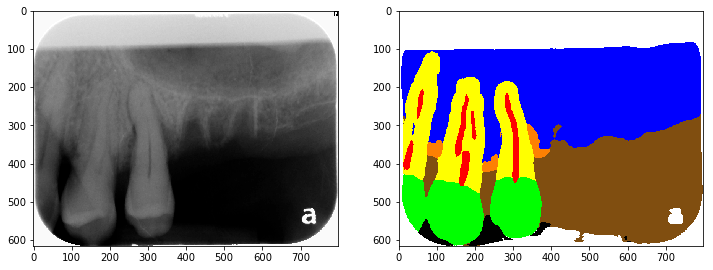

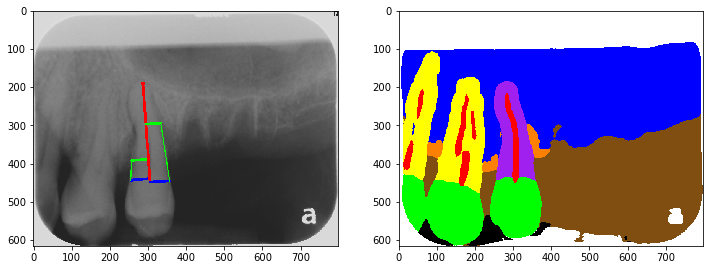

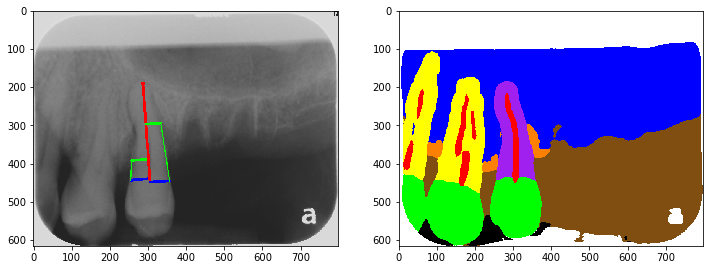

52 : NN_190826_150428_BD3550
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|     | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|-----+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 207 | 12D          |       3 | 12_R                |      20.901 |           2 | NN_190826_150428_BD3550_2.PNG |
| 208 | 13M          |       3 | 13_L                |      10.535 |           1 | NN_190826_150428_BD3550_3.PNG |
+-----+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_R', '13_LR']


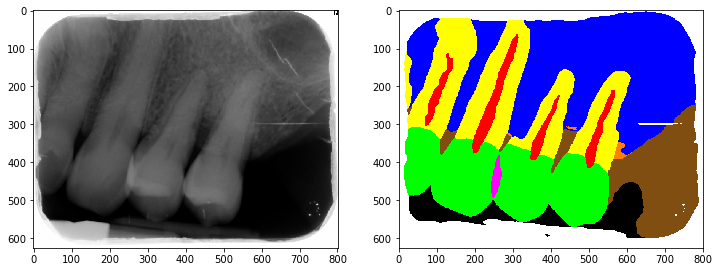

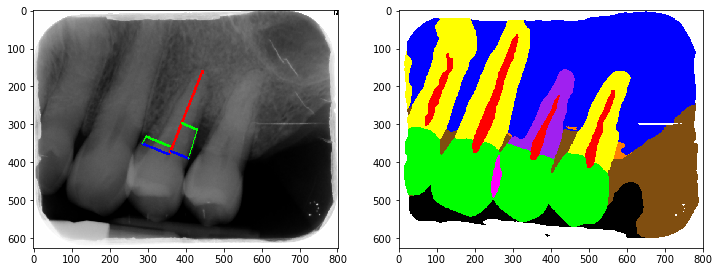

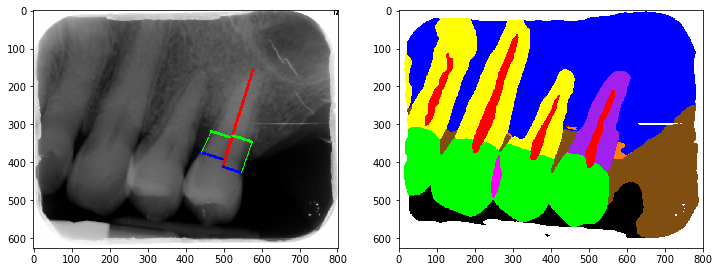

53 : NN_190911_161859_4C090
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2948 | 18D          |       3 | 18_R                |      22.509 |           2 | NN_190911_161859_4C090_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['19_LR', '18_LR']


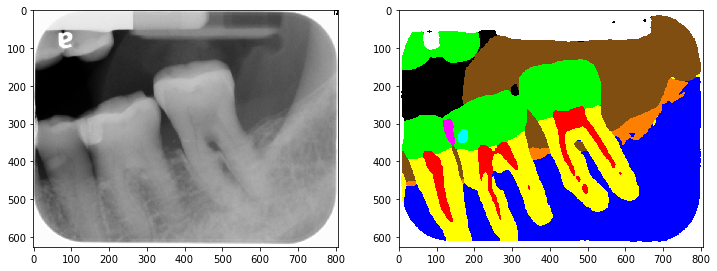

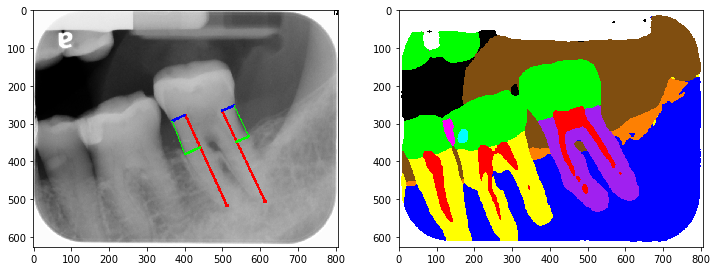

54 : NN_190926_131456_4C087
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                   |
|------+--------------+---------+---------------------+-------------+-------------+------------------------------|
| 2949 | 12M          |       3 | 12_L                |      54.185 |           3 | NN_190926_131456_4C087_1.PNG |
| 2950 | 12D          |       3 | 12_R                |       8.374 |           1 | NN_190926_131456_4C087_1.PNG |
| 2951 | 13M          |       3 | 13_L                |      10.493 |           1 | NN_190926_131456_4C087_2.PNG |
| 2952 | 13D          |       3 | 13_R                |       6.283 |           1 | NN_190926_131456_4C087_2.PNG |
+------+--------------+---------+---------------------+-------------+-------------+------------------------------+
Root in json: ['12_LR', '13_LR']


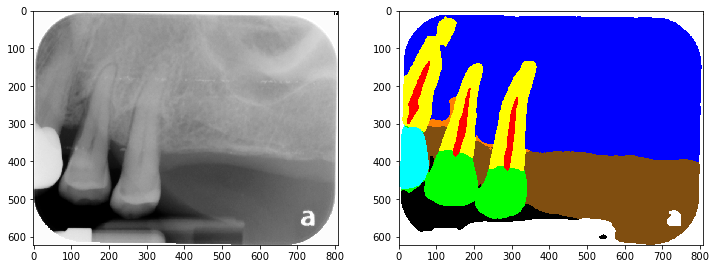

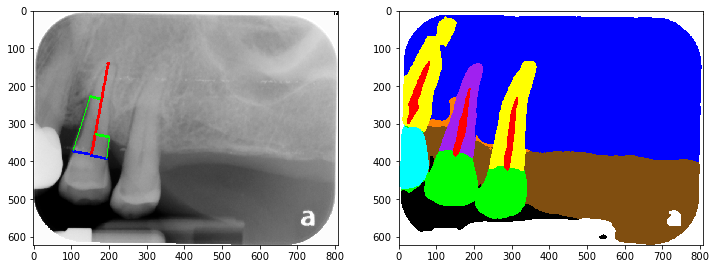

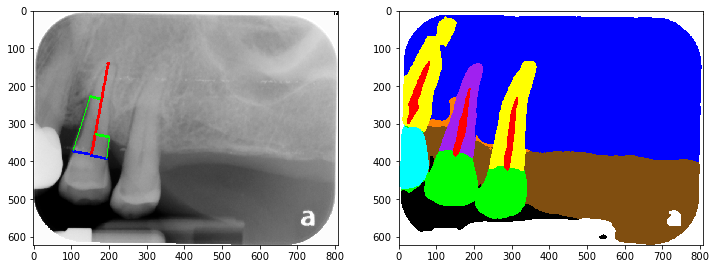

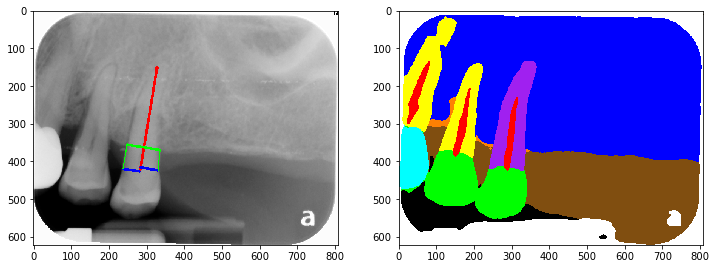

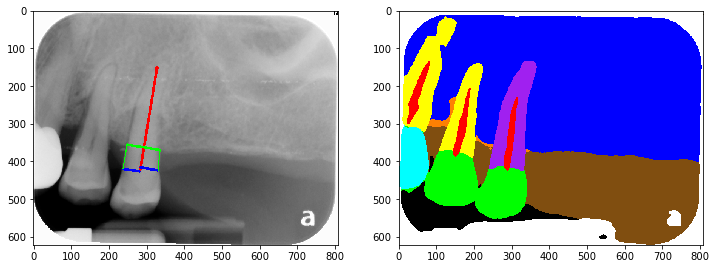

55 : N_151007_110353_C04FFA
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
|      | tooth_side   |   stage | PBL_predict_tooth   |   PBL_value |   PBL_stage | tooth_path                    |
|------+--------------+---------+---------------------+-------------+-------------+-------------------------------|
| 9637 | 14M          |       3 | 14_L                |      10.458 |           1 | NN_151007_110353_C04FFA_3.PNG |
| 9638 | 14D          |       3 | 14_R                |      10.528 |           1 | NN_151007_110353_C04FFA_3.PNG |
+------+--------------+---------+---------------------+-------------+-------------+-------------------------------+
Root in json: ['12_LR', '14_LR']


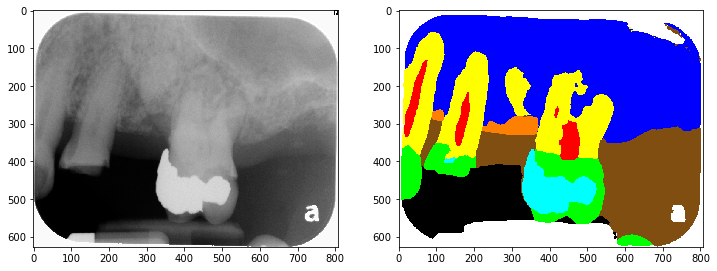

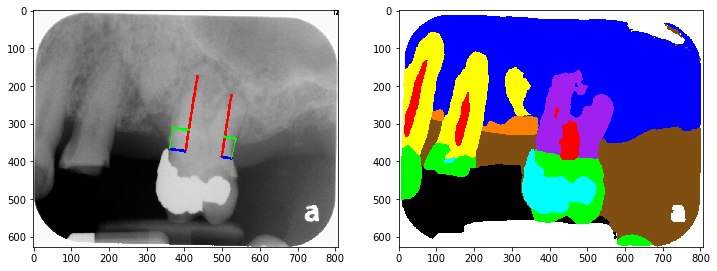

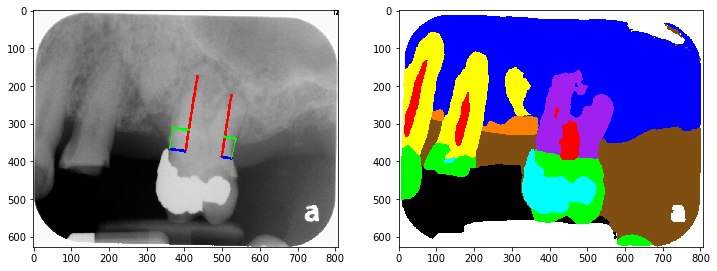


121


In [13]:
target_table_img_name = target_table['image_name']
target_name_list = list(set(list(target_table_img_name)))
target_name_list.sort()
print(len(target_name_list))
target_name_list = target_name_list[:]

#assert target_case['PBL_stage'] != 'No_match','Cannot be No_match'
count = 0

if target_case['PBL_stage']!='No_match':
    for index,image_name in tqdm(enumerate(target_name_list),total=len(target_name_list)):
        print(index,":",image_name)
        Match_tooth_json = [json_path for json_path in json_file_list if image_name in json_path]
        target_o = [img_path for img_path in o_image_path_list if image_name in img_path]
        target_s = [img_path for img_path in s_image_path_list if image_name in img_path]
        target_info = [img_path for img_path in seg_image_info_path_list if image_name in img_path]
        target_pattern = [img_path for img_path in seg_fill_image_point_path_list if image_name in img_path]
        
        target_csv = show_csv.loc[(show_csv['image_name'] == image_name)]
        target_csv = target_csv.loc[(target_csv['stage'] == target_case['stage'])]
        target_csv['PBL_value'] = pd.to_numeric(target_csv['PBL_value'], errors='coerce')
        target_csv = target_csv.dropna()
#         if target_case['stage']==2 and type_==1:
#             target_csv = target_csv.loc[(target_csv['PBL_value'] > PBL_value_range[1][0]) & (target_csv['PBL_value'] < PBL_value_range[1][1])]
#         else:
#             target_csv = target_csv.loc[(target_csv['PBL_value'] > PBL_value_range[0][0]) & (target_csv['PBL_value'] < PBL_value_range[0][1])]
# #         target_table = show_table
        target_csv = target_csv[['tooth_side','stage','PBL_predict_tooth','PBL_value','PBL_stage','tooth_path']]
        print(tabulate(target_csv, headers='keys', tablefmt='psql'))
        count+=len(target_csv)
        if Match_tooth_json != []:
            tooth_in_json_list = []
            with open(Match_tooth_json[0], 'r') as file:
                json_file = json.load(file)
                for tooth in json_file['shapes']:
                    title = tooth['label']
                    tooth_in_json_list.append(title)
            print('Root in json:',tooth_in_json_list)
            
        if target_o != []:
            o_img = cv2.imread(target_o[0],0)
            s_img = cv2.imread(target_s[0])
            plt.figure(figsize=(12,12))
            plt.subplot(121)
            plt.imshow(o_img,cmap='gray')
            plt.subplot(122)
            plt.imshow(cv2.cvtColor(s_img,cv2.COLOR_BGR2RGB))
            plt.show()
        show_img_list = list(target_csv['tooth_path'])
        for p_img_name in show_img_list:
            blank_image = np.zeros((o_img.shape[0], o_img.shape[1], 3), np.uint8)
            target_info = [img_path for img_path in seg_image_info_path_list if p_img_name[:-4] in img_path]
            target_pattern = [img_path for img_path in seg_fill_image_point_path_list if p_img_name[:-4] in img_path]
            target_info_img = blank_image.copy()
            target_pattern_img = blank_image.copy()
            if target_info!=[]:
                target_info_img = cv2.cvtColor(cv2.imread(target_info[0]),cv2.COLOR_BGR2RGB)
            if target_pattern!=[]:
                target_pattern_img = cv2.cvtColor(cv2.imread(target_pattern[0]),cv2.COLOR_BGR2RGB) 
            plt.figure(figsize=(12,21))
            plt.subplot(121)
            plt.imshow(target_info_img)
            plt.subplot(122)
            plt.imshow(target_pattern_img)
            plt.show()
            
print(count)

In [14]:
img_path_list = glob.glob('/root/notebooks/tooth_thsis_experiment/PBL_detection/Data/atient_folder/*/*/*.PNG')
print(len(img_path_list))

0


In [15]:
for path in tqdm(img_path_list, total=len(img_path_list)):
    os.remove(path)

In [16]:
# json_list = glob.glob('/root/notebooks/tooth_thsis_experiment/PBL_detection/Data/atient_folder/*/*/*.json')
# print(len(json_list))

# # json_list = glob.glob('/root/notebooks/tooth_thsis_experiment/PBL_detection/Data/patient_folder/*/*/*.json')
# # print(len(json_list))

In [17]:
# save_path = '/root/notebooks/tooth_thsis_experiment/PBL_detection/Data/json_file/'

# for path in tqdm(json_list, total=len(json_list)):
#     json_name = path.split('/')[-1]
#     shutil.copyfile(path, os.path.join(save_path, json_name))

In [18]:
2977

2977

In [19]:
# json_list = glob.glob('/root/notebooks/tooth_thsis_experiment/PBL_detection/Data/json_file/*.json')
# print(len(json_list))